# The real experiment

In [1]:
%matplotlib inline

In [2]:
%run -i ~/Documents/profile_collection/startup/00-startup.py

environment variable BLUESKY_IPYTHON_LOG_FILE is not set, using default file path '/home/xf28id2/.cache/bluesky/log/bluesky_ipython.log'


Activating auto-logging. Current session state plus future input saved.
Filename       : /home/xf28id2/.cache/bluesky/log/bluesky_ipython.log
Mode           : append
Output logging : True
Raw input log  : False
Timestamping   : True
State          : active
Exception reporting mode: Minimal


In [3]:
%run -i ~/Documents/profile_collection/startup/20-motors.py
%run -i ~/Documents/profile_collection/startup/21-signals.py
%run -i ~/Documents/profile_collection/startup/30-detectors_and_cameras.py
%run -i ~/Documents/profile_collection/startup/90-functions.py

In [4]:
%run -i ~/Documents/tomology/tomography/plans.py

## The broker of the database

In [7]:
from databroker import catalog
raw = catalog['xpdd']

## Publish the data to localhost:5567

In [6]:
from bluesky.callbacks.zmq import Publisher

publisher = Publisher(("localhost", 5567), prefix=b'raw')
RE.subscribe(publisher)

2

## Beamtiem Metadata

In [11]:
RE.md["bt_safn"] = 307622
RE.md["proposal_id"] = 307690

## GLOBAL VARIABLEs

In [8]:
SHUTTER_CLOSE = -47
SHUTTER_OPEN = 0

## Sample Information

In [9]:
SAMPLE1 = {
    "sample_name": "PARADIM-1",
    "sample_composition": "TiO2",
    "sample_polymorph": "rutile",
    "growth_condition": "5 mm/hr in oxygen (ambient pressure), counter rotation 10 rmp, laser tilt angle 0."
}

In [60]:
SAMPLE2 = {
    "sample_name": "CG-0046",
    "sample_composition": "TiO2",
    "sample_polymorph": "rutile",
    "growth_condition": "20 mm/hr in air (ambient pressure), counter rotation 20 rmp"
}

In [38]:
SAMPLE3 = {
    "sample_name": "CG-0032",
    "sample_composition": "TiO2",
    "sample_polymorph": "rutile",
    "growth_condition": "10 mm/hr in air (ambient pressure), counter rotation 20 rmp"
}

In [39]:
SAMPLE4 = {
    "sample_name": "CG-0048",
    "sample_composition": "TiO2",
    "sample_polymorph": "rutile",
    "growth_condition": "5 mm/hr in air (ambient pressure), counter rotation 20 rmp"
}

## Experiment 1: calibration

In [12]:
RE(grid_scan_nd([dexela_c], mBaseY, 45, 45, 1, time_per_point=10, time_per_frame=0.1, shutter=FastShutter, shutter_close=SHUTTER_CLOSE, sj))



Transient Scan ID: 23     Time: 2021-07-26 16:40:08
Persistent Unique Scan ID: 'a197f850-96cb-4fab-85f9-61692c907c80'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 16:40:30.3 |          4204332788 |
+-----------+------------+---------------------+
generator grid_scan ['a197f850'] (scan num: 23)





('a197f850-96cb-4fab-85f9-61692c907c80',)

In [15]:
RE(grid_scan_nd([dexela_c, mBaseX], mBaseX, -1., -2.2, 13, time_per_point=0.1, time_per_frame=0.1, 
                shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN, md={"task": "alignment of calibrant"}))



Transient Scan ID: 25     Time: 2021-07-26 16:50:37
Persistent Unique Scan ID: '8ab2d3d5-29b1-4227-9588-675b853ecb91'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 16:50:43.8 |    -1.0000 |          3905426311 |
|         2 | 16:50:46.0 |    -1.1000 |          3913221718 |
|         3 | 16:50:48.2 |    -1.2000 |          3915765161 |
|         4 | 16:50:50.3 |    -1.3000 |          3919259802 |
|         5 | 16:50:52.7 |    -1.4000 |          3920782171 |
|         6 | 16:50:55.0 |    -1.5000 |          3919148492 |
|         7 | 16:50:57.3 |    -1.6000 |          3919257716 |
|         8 | 16:50:59.3 |    -1.7000 |          3918481469 |
|         9 | 16:51:01.4 |    -1.8000 |          3913264327 |
|        10 | 16:51:03.6 |    -1.9000 |          3902414507 |
|        11 | 16:51:05.9 |    -2.

('8ab2d3d5-29b1-4227-9588-675b853ecb91',)

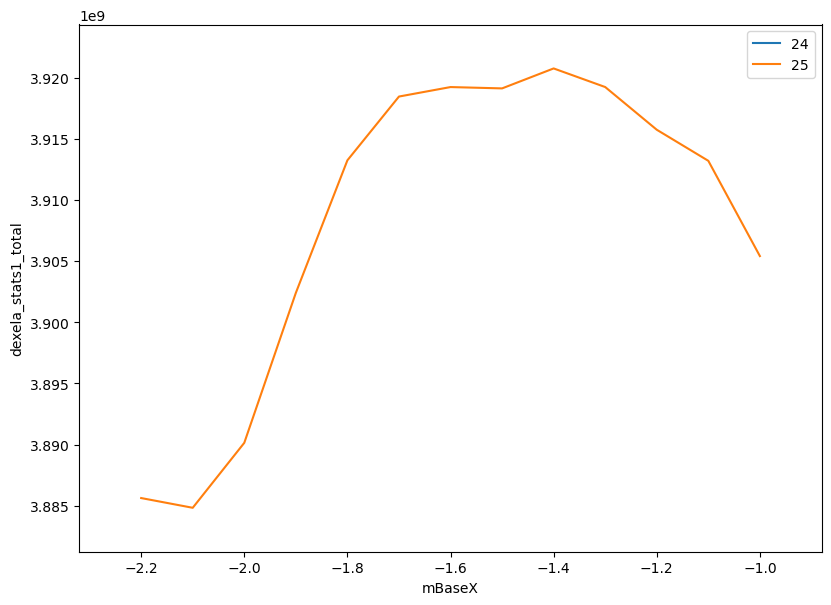

In [16]:
plt.gcf()

In [17]:
RE(bps.mv(mBaseX, -1.46))

()

In [9]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.46, -1.46, 1, time_per_point=10, time_per_frame=0.2,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.2, shutter_wait_open=0.2,
    md={"task": "calibration agin"}
)
RE(plan)



Transient Scan ID: 35     Time: 2021-07-26 17:10:59
Persistent Unique Scan ID: '1a7f3104-5198-459a-baac-cc99543d25c8'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 17:11:22.1 |          4216713696 |
+-----------+------------+---------------------+
generator grid_scan ['1a7f3104'] (scan num: 35)





('1a7f3104-5198-459a-baac-cc99543d25c8',)

In [10]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.46, -1.46, 1, time_per_point=10, time_per_frame=0.2,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "single count TiO2 powder"}
)
RE(plan)



Transient Scan ID: 36     Time: 2021-07-26 17:22:21
Persistent Unique Scan ID: '90adffe6-0d1b-4d18-85b4-56dcc075c4c4'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 17:22:43.5 |          4172238051 |
+-----------+------------+---------------------+
generator grid_scan ['90adffe6'] (scan num: 36)





('90adffe6-0d1b-4d18-85b4-56dcc075c4c4',)

In [11]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.2, -1.7, 11, time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "find the center of the tube of TiO2 powder"}
)
RE(plan)



Transient Scan ID: 37     Time: 2021-07-26 17:23:31
Persistent Unique Scan ID: '95f43278-a2b7-4250-8be9-a01b39d5c96a'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 17:23:34.0 |          3902386489 |
|         2 | 17:23:36.3 |          3905678058 |
|         3 | 17:23:38.7 |          3903849018 |
|         4 | 17:23:40.9 |          3906429787 |
|         5 | 17:23:43.1 |          3905540198 |
|         6 | 17:23:45.2 |          3900646625 |
|         7 | 17:23:48.0 |          3903998536 |
|         8 | 17:23:50.1 |          3903425615 |
|         9 | 17:23:52.4 |          3902370185 |
|        10 | 17:23:54.6 |          3901054385 |
|        11 | 17:23:57.1 |          3898499029 |
+-----------+------------+---------------------+
generator grid_scan ['95f43278'] (scan num: 37)
LivePlot did not get any data that corresponds to the x 

('95f43278-a2b7-4250-8be9-a01b39d5c96a',)

In [12]:
plan = grid_scan_nd(
    [dexela_c, mBaseX], mBaseX, -1.2, -1.7, 11, time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "find the center of the tube of TiO2 powder again"}
)
RE(plan)



Transient Scan ID: 38     Time: 2021-07-26 17:24:14
Persistent Unique Scan ID: '8b84882e-44ff-4c67-844f-184a2fd90963'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 17:24:18.0 |    -1.2000 |          3902825437 |
|         2 | 17:24:20.3 |    -1.2500 |          3905771848 |
|         3 | 17:24:22.7 |    -1.3000 |          3904660198 |
|         4 | 17:24:24.8 |    -1.3500 |          3907316570 |
|         5 | 17:24:27.0 |    -1.4000 |          3906437345 |
|         6 | 17:24:29.2 |    -1.4500 |          3899818868 |
|         7 | 17:24:31.6 |    -1.5000 |          3903490168 |
|         8 | 17:24:33.9 |    -1.5500 |          3904108467 |
|         9 | 17:24:36.2 |    -1.6000 |          3902385349 |
|        10 | 17:24:38.4 |    -1.6500 |          3900888576 |
|        11 | 17:24:40.6 |    -1.

('8b84882e-44ff-4c67-844f-184a2fd90963',)

In [16]:
plan = grid_scan_nd(
    [dexela_c, mBaseX], mBaseX, -1.2, -1.7, 11, time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    take_dark=False,
    md={"sample_name": "TiO2_unsintered_powder", "task": "find the center of the tube of TiO2 powder again"}
)
RE(plan)



Transient Scan ID: 40     Time: 2021-07-26 17:26:34
Persistent Unique Scan ID: 'ccd9ef63-3f81-4fbb-9319-1854e0e75146'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 17:26:37.3 |    -1.2000 |          3902609883 |
|         2 | 17:26:38.6 |    -1.2500 |          3906654815 |
|         3 | 17:26:39.7 |    -1.3000 |          3904326759 |
|         4 | 17:26:40.7 |    -1.3500 |          3903999582 |
|         5 | 17:26:41.8 |    -1.4000 |          3905592229 |
|         6 | 17:26:42.8 |    -1.4500 |          3899651170 |
|         7 | 17:26:43.8 |    -1.5000 |          3902375576 |
|         8 | 17:26:44.8 |    -1.5500 |          3903356094 |
|         9 | 17:26:45.9 |    -1.6000 |          3902194430 |
|        10 | 17:26:46.8 |    -1.6500 |          3898541208 |
|        11 | 17:26:47.8 |    -1.7000 |          389

('ccd9ef63-3f81-4fbb-9319-1854e0e75146',)

In [18]:
plan = grid_scan_nd(
    [dexela_c, mBaseX], mBaseX, -0.5, -3, 26, time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    take_dark=False,
    md={"sample_name": "TiO2_unsintered_powder", "task": "find the center of the tube of TiO2 powder again"}
)
RE(plan)



Transient Scan ID: 41     Time: 2021-07-26 17:27:16
Persistent Unique Scan ID: 'c3f30d34-c688-4179-b513-a39e53a162d0'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 17:27:23.1 |    -0.5000 |          3889216544 |
|         2 | 17:27:24.2 |    -0.6000 |          3889062068 |
|         3 | 17:27:25.3 |    -0.7000 |          3897743265 |
|         4 | 17:27:26.5 |    -0.8000 |          3899351152 |
|         5 | 17:27:27.6 |    -0.9000 |          3903705957 |
|         6 | 17:27:28.8 |    -1.0000 |          3906958844 |
|         7 | 17:27:30.0 |    -1.1000 |          3905294756 |
|         8 | 17:27:31.1 |    -1.2000 |          3903766038 |
|         9 | 17:27:32.2 |    -1.3000 |          3903439444 |
|        10 | 17:27:33.4 |    -1.4000 |          3905422429 |
|        11 | 17:27:34.5 |    -1.5000 |          390

('c3f30d34-c688-4179-b513-a39e53a162d0',)

In [20]:
RE(bps.mv(mBaseX, -1.2))

()

In [21]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.46, -1.46, 1, time_per_point=10, time_per_frame=0.2,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "single count TiO2 powder agin"}
)
RE(plan)



Transient Scan ID: 42     Time: 2021-07-26 17:29:08
Persistent Unique Scan ID: '3b919dd7-f330-48c3-b3ee-8db567c920cc'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 17:29:14.9 |          4170697518 |
+-----------+------------+---------------------+
generator grid_scan ['3b919dd7'] (scan num: 42)





('3b919dd7-f330-48c3-b3ee-8db567c920cc',)

In [11]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.2, -1.2, 1, time_per_point=10, time_per_frame=0.2,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "single count TiO2 powder agin"}
)
RE(plan)



Transient Scan ID: 44     Time: 2021-07-26 17:39:06
Persistent Unique Scan ID: '3837a6cb-ca8a-4c12-8803-acc4a4ca74db'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 17:39:29.1 |          4177474867 |
+-----------+------------+---------------------+
generator grid_scan ['3837a6cb'] (scan num: 44)





('3837a6cb-ca8a-4c12-8803-acc4a4ca74db',)

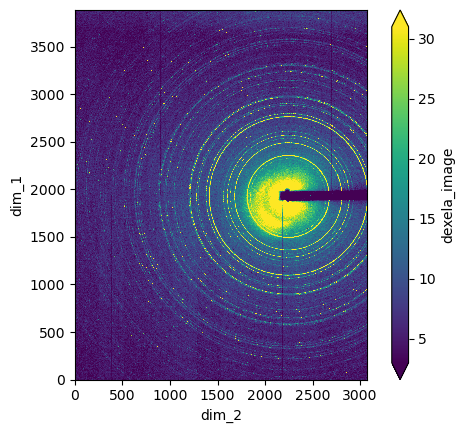

In [25]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [26]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.2, -1.2, 1, time_per_point=10, time_per_frame=1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "single count TiO2 powder again"}
)
RE(plan)



Transient Scan ID: 45     Time: 2021-07-26 17:48:11
Persistent Unique Scan ID: '9088102d-dac6-477b-85c9-a592460ff8e2'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 17:48:33.2 |          6378806130 |
+-----------+------------+---------------------+
generator grid_scan ['9088102d'] (scan num: 45)





('9088102d-dac6-477b-85c9-a592460ff8e2',)

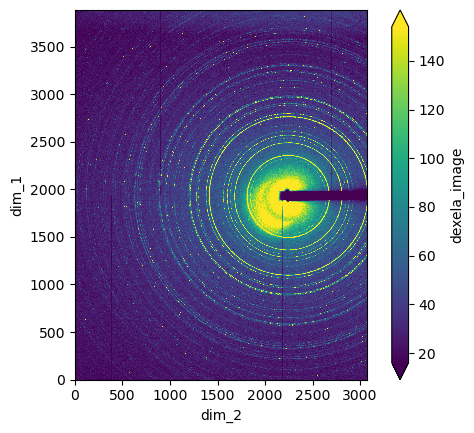

In [27]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [28]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.2, -1.2, 1, time_per_point=10, time_per_frame=1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0.1, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "single count TiO2 powder again"}
)
RE(plan)



Transient Scan ID: 46     Time: 2021-07-26 17:49:37
Persistent Unique Scan ID: 'd870978a-4e17-419c-b371-29aa73d40b7b'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 17:49:59.2 |          6385676078 |
+-----------+------------+---------------------+
generator grid_scan ['d870978a'] (scan num: 46)





('d870978a-4e17-419c-b371-29aa73d40b7b',)

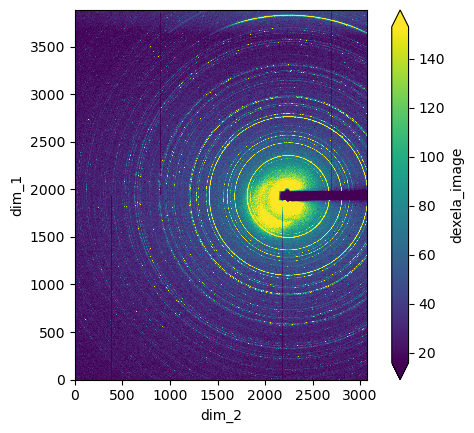

In [29]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [30]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.2, -1.2, 1, time_per_point=10, time_per_frame=1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=2, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "single count TiO2 powder again"}
)
RE(plan)



Transient Scan ID: 47     Time: 2021-07-26 17:51:29
Persistent Unique Scan ID: '0335b4bf-9ee8-42d9-98ac-0e4a355b038f'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 17:51:53.2 |          6381261464 |
+-----------+------------+---------------------+
generator grid_scan ['0335b4bf'] (scan num: 47)





('0335b4bf-9ee8-42d9-98ac-0e4a355b038f',)

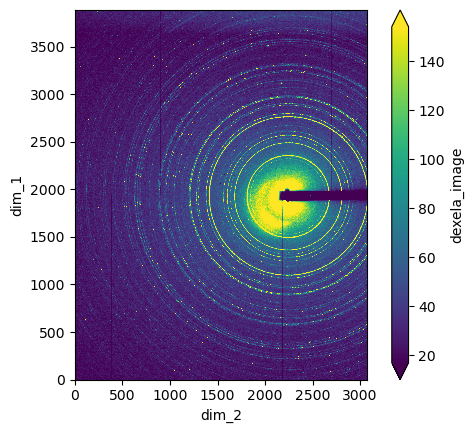

In [31]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [32]:
RE(bps.mv(FastShutter, SHUTTER_OPEN))

()

In [36]:
data_file = "/nsls2/data/xpd/legacy/processed/xpdUser/tiff_base/TiO2_unsintered_powder_0335b4bf-9ee8-42d9-98ac-0e4a355b038f/tiff/TiO2_unsintered_powder_1_image.dat"
q, i = np.loadtxt(data_file).T
data = xr.DataArray(i, coords={"Q": q}, dims=["Q"])
plt.figure()
data.plot()

In [37]:
from tifffile.tifffile import TiffWriter

In [38]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1.2, -1.2, 1, time_per_point=10, time_per_frame=1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=2, shutter_wait_open=0.1,
    md={"sample_name": "TiO2_unsintered_powder", "task": "single count TiO2 powder again"}
)
RE(plan)



Transient Scan ID: 48     Time: 2021-07-26 18:00:46
Persistent Unique Scan ID: '058d3abb-c0e2-4342-9083-966103a29996'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 18:01:10.4 |          9416069962 |
+-----------+------------+---------------------+
generator grid_scan ['058d3abb'] (scan num: 48)





('058d3abb-c0e2-4342-9083-966103a29996',)

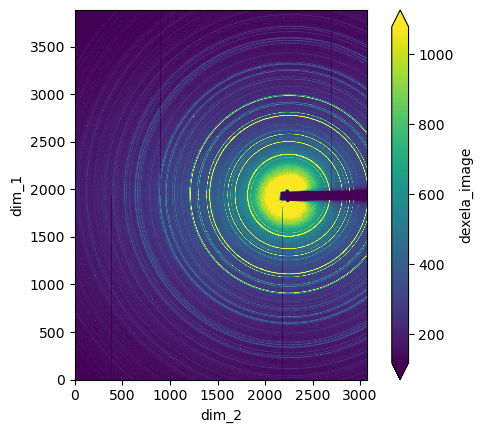

In [42]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

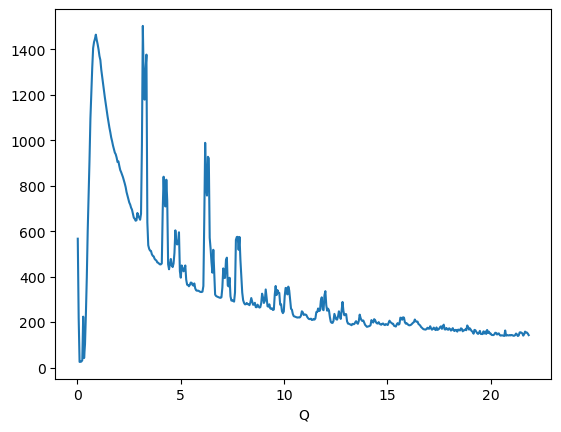

In [43]:
data_file = "/nsls2/data/xpd/legacy/processed/xpdUser/tiff_base/TiO2_unsintered_powder_058d3abb-c0e2-4342-9083-966103a29996/tiff/TiO2_unsintered_powder_1_image.dat"
q, i = np.loadtxt(data_file).T
data = xr.DataArray(i, coords={"Q": q}, dims=["Q"])
plt.figure()
data.plot()
plt.gcf()

In [44]:
import pyFAI

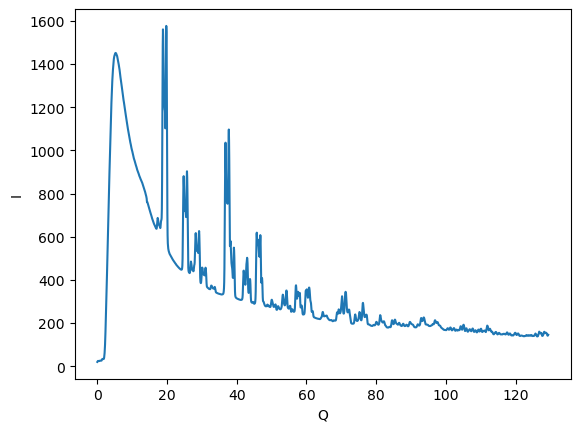

In [56]:
# dark subtraction and integrate to 1d line
run = raw[-7]
data = run.primary.read()
dark = run.dark.read()

subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
ai = pyFAI.load("/nsls2/data/xpd/legacy/processed/xpdUser/tiff_base/Si_standard_calib_2.poni")
q, i = ai.integrate1d(subtracted.values, npt=2048)
i_data = xr.DataArray(i, coords={"Q": q}, dims=["Q"])
i_data.attrs.update({"standard_name": "I"})

fig, ax = plt.subplots()
i_data.plot.line(ax=ax)
plt.gcf()

In [57]:
import fabio

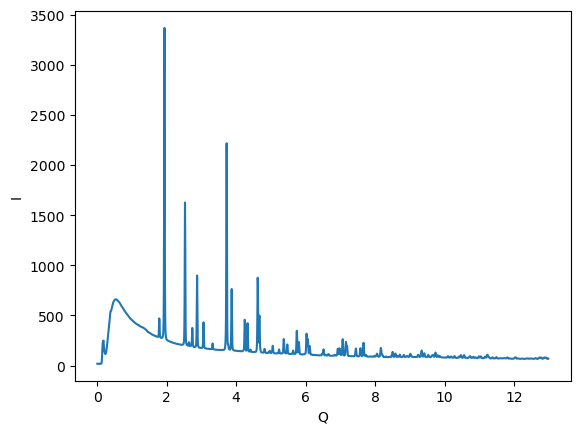

In [62]:
# dark subtraction and integrate to 1d line
subtracted = fabio.open("/nsls2/data/xpd/legacy/processed/from_mehmet/TiO2_0.25x0.25_beam.tiff").data
ai = pyFAI.load("/nsls2/data/xpd/legacy/processed/from_mehmet/CeO2_0.25x0.25_beam.poni")
q, i = ai.integrate1d(subtracted, npt=2048, unit="q_A^-1")
i_data = xr.DataArray(i, coords={"Q": q}, dims=["Q"])
i_data.attrs.update({"standard_name": "I"})

fig, ax = plt.subplots()
i_data.plot.line(ax=ax)
plt.gcf()

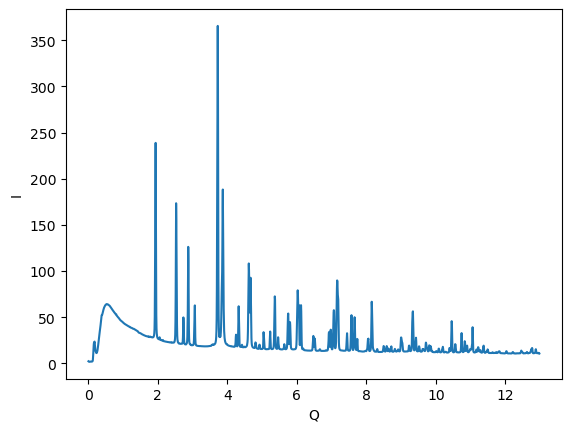

In [64]:
# dark subtraction and integrate to 1d line
subtracted = fabio.open("/nsls2/data/xpd/legacy/processed/from_mehmet/TiO2spotty_0.25x0.25_beam.tiff").data
ai = pyFAI.load("/nsls2/data/xpd/legacy/processed/from_mehmet/CeO2_0.25x0.25_beam.poni")
q, i = ai.integrate1d(subtracted, npt=2048, unit="q_A^-1")
i_data = xr.DataArray(i, coords={"Q": q}, dims=["Q"])
i_data.attrs.update({"standard_name": "I"})

fig, ax = plt.subplots()
i_data.plot.line(ax=ax)
plt.gcf()

In [67]:
RE(bps.mv(mBaseY, 43))

()

In [69]:
Filters.read()

OrderedDict([('fb_flt1', {'value': 'Out', 'timestamp': 1627324861.362802}),
             ('fb_flt2', {'value': 'Out', 'timestamp': 1627001620.991431}),
             ('fb_flt3', {'value': 'Out', 'timestamp': 1627324861.362815}),
             ('fb_flt4', {'value': 'Out', 'timestamp': 1627001629.998106})])

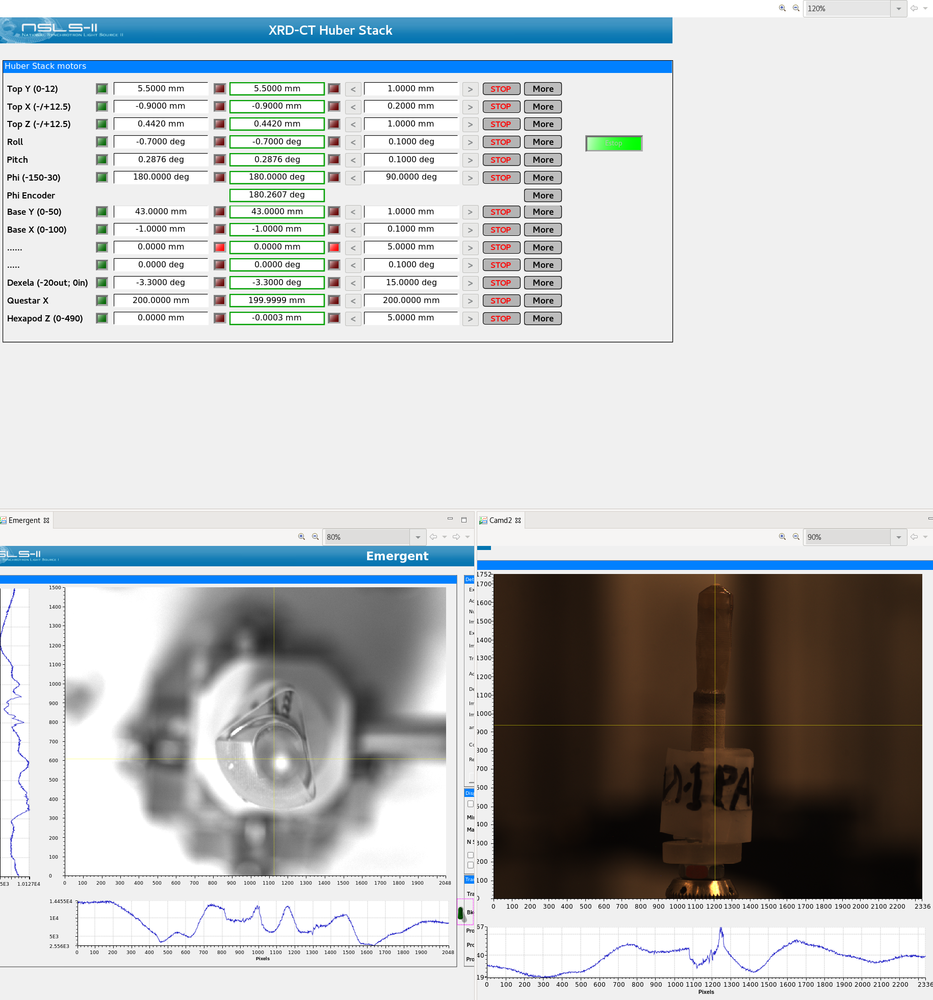

In [73]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1, -1, 1, mBaseY, 43, 43, 1,
    time_per_point=5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=2, shutter_wait_open=0.1,
    md=dict(**SAMPLE1, task="powder diffraction, all filter out")
)
RE(plan)



Transient Scan ID: 49     Time: 2021-07-26 21:08:49
Persistent Unique Scan ID: 'af824d50-c094-4d82-91b6-bcb152d60dee'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 21:08:58.4 |          4965692952 |
+-----------+------------+---------------------+
generator grid_scan ['af824d50'] (scan num: 49)





('af824d50-c094-4d82-91b6-bcb152d60dee',)

In [13]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1, -1, 1, mBaseY, 43, 43, 1,
    time_per_point=5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=2, shutter_wait_open=0.1,
    md=dict(**SAMPLE1, task="powder diffraction, all filter out")
)
RE(plan)



Transient Scan ID: 50     Time: 2021-07-26 21:14:00
Persistent Unique Scan ID: 'c3efe058-913a-4f59-91b7-af184b2ac3c5'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 21:14:09.5 |          4965117849 |
+-----------+------------+---------------------+
generator grid_scan ['c3efe058'] (scan num: 50)





('c3efe058-913a-4f59-91b7-af184b2ac3c5',)

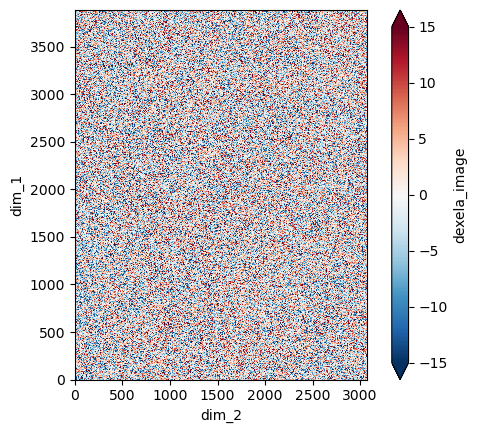

In [14]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [17]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1, -1, 1, mBaseY, 43, 43, 1,
    time_per_point=5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="powder diffraction, all filter out"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 53     Time: 2021-07-26 21:24:43
Persistent Unique Scan ID: '60a4d009-fc1f-4af5-8cd1-7a843e669ce4'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 21:24:45.0 |          4969850566 |
+-----------+------------+---------------------+
generator grid_scan ['60a4d009'] (scan num: 53)





('60a4d009-fc1f-4af5-8cd1-7a843e669ce4',)

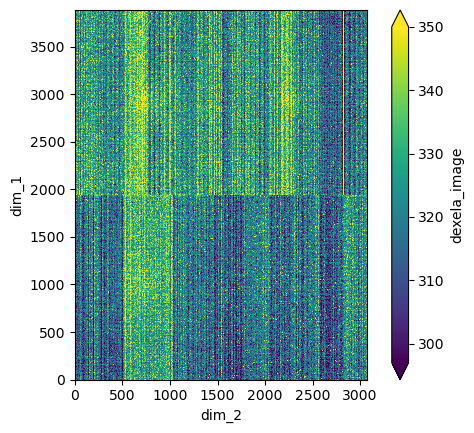

In [26]:
run = raw[-2]
data = run.primary.read()
# dark = raw[-2].primary.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [14]:
def open_shutter():
    return (yield from bps.mv(FastShutter, SHUTTER_OPEN))

def close_shutter():
    return (yield from bps.mv(FastShutter, SHUTTER_CLOSE))

In [16]:
plan = grid_scan_no_dark(
    [dexela_c], mBaseX, -1, -1, 1, mBaseY, 43, 43, 1,
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="powder diffraction, all filter out")
)
RE(plan)



Transient Scan ID: 54     Time: 2021-07-26 22:17:18
Persistent Unique Scan ID: 'adfcf3f8-16e6-4adb-bf36-efb75ef749da'
New stream: 'primary'
+-----------+------------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX |     mBaseY | dexela_stats1_total |
+-----------+------------+------------+------------+---------------------+
|         1 | 22:17:20.7 |    -1.0000 |    43.0000 |                   0 |
+-----------+------------+------------+------------+---------------------+
generator grid_scan ['adfcf3f8'] (scan num: 54)





('adfcf3f8-16e6-4adb-bf36-efb75ef749da',)

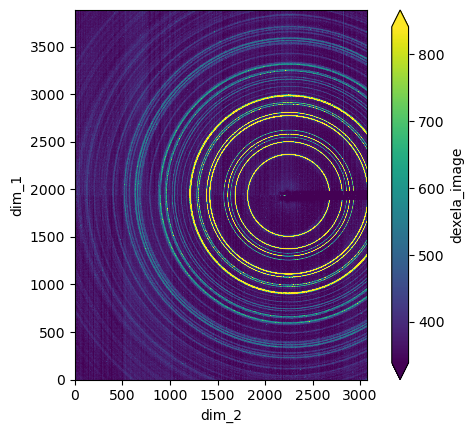

In [18]:
run = raw[-1]
data = run.primary.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [20]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1, -1, 1, mBaseY, 43, 43, 1,
    time_per_point=5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="powder diffraction, all filter out, with dark"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 55     Time: 2021-07-26 22:18:48
Persistent Unique Scan ID: '3328d111-067f-44de-9ee5-431bfeb71742'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 22:18:54.0 |                   0 |
+-----------+------------+---------------------+
generator grid_scan ['3328d111'] (scan num: 55)





('3328d111-067f-44de-9ee5-431bfeb71742',)

In [21]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1, -1, 1, mBaseY, 43, 43, 1,
    time_per_point=5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="powder diffraction, all filter out, with dark"),
    take_dark=True
)
RE(plan)



Transient Scan ID: 56     Time: 2021-07-26 22:19:01
Persistent Unique Scan ID: 'cbe9b0fb-8c5d-4b54-8b41-38dca541cd9f'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 22:19:14.1 |                   0 |
+-----------+------------+---------------------+
generator grid_scan ['cbe9b0fb'] (scan num: 56)





('cbe9b0fb-8c5d-4b54-8b41-38dca541cd9f',)

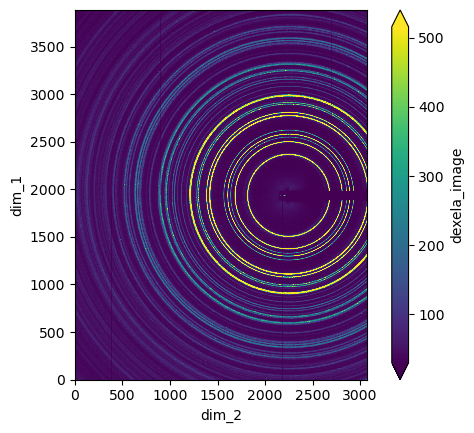

In [22]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [27]:
import pyFAI

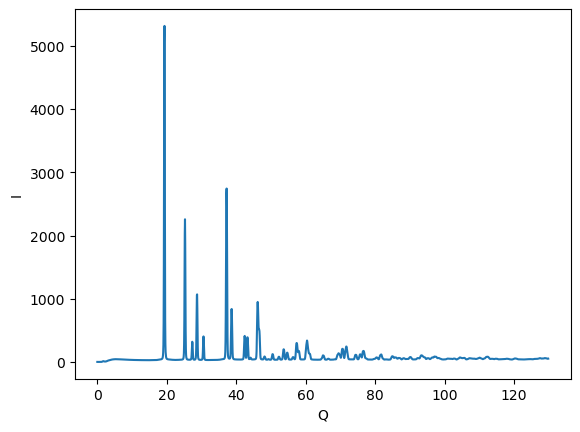

In [28]:
# dark subtraction and integrate to 1d line
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
ai = pyFAI.load("/nsls2/data/xpd/legacy/processed/from_mehmet/CeO2_0.25x0.25_beam.poni")
q, i = ai.integrate1d(subtracted.values, npt=2048)
i_data = xr.DataArray(i, coords={"Q": q}, dims=["Q"])
i_data.attrs.update({"standard_name": "I"})

fig, ax = plt.subplots()
i_data.plot.line(ax=ax)
plt.gcf()

In [24]:
RE(
    bpp.pchain(
        bps.mv(Filters.flt1, "In"),
        bps.mv(Filters.flt2, "In"),
        bps.mv(Filters.flt3, "In"),
        bps.mv(Filters.flt4, "In")
    )
)

()

In [25]:
Filters.read()

OrderedDict([('fb_flt1', {'value': 'In', 'timestamp': 1627352477.530588}),
             ('fb_flt2', {'value': 'In', 'timestamp': 1627352477.5306}),
             ('fb_flt3', {'value': 'In', 'timestamp': 1627352477.530603}),
             ('fb_flt4', {'value': 'In', 'timestamp': 1627352477.530605})])

In [29]:
plan = grid_scan_nd(
    [dexela_c], mBaseX, -1, -1, 1, mBaseY, 43, 43, 1,
    time_per_point=5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="powder diffraction, all filter in, with dark"),
    take_dark=True
)
RE(plan)



Transient Scan ID: 57     Time: 2021-07-26 22:23:51
Persistent Unique Scan ID: 'fbc4b9cc-1c38-4ac4-bd09-e6c86a866b34'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 22:24:04.0 |                   0 |
+-----------+------------+---------------------+
generator grid_scan ['fbc4b9cc'] (scan num: 57)





('fbc4b9cc-1c38-4ac4-bd09-e6c86a866b34',)

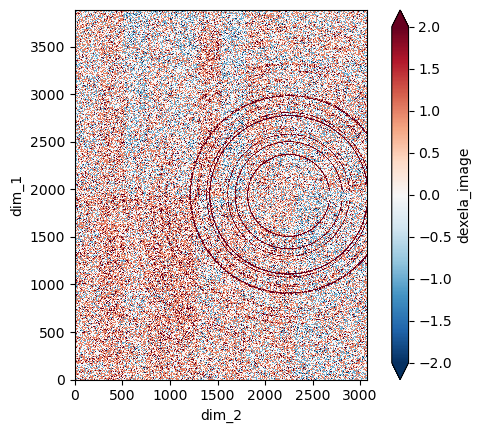

In [30]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

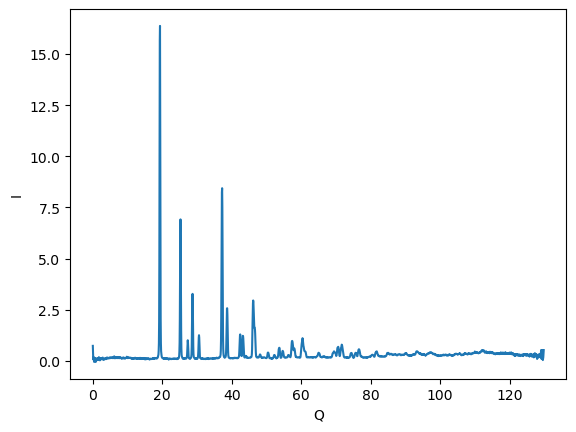

In [31]:
# dark subtraction and integrate to 1d line
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
ai = pyFAI.load("/nsls2/data/xpd/legacy/processed/from_mehmet/CeO2_0.25x0.25_beam.poni")
q, i = ai.integrate1d(subtracted.values, npt=2048)
i_data = xr.DataArray(i, coords={"Q": q}, dims=["Q"])
i_data.attrs.update({"standard_name": "I"})

fig, ax = plt.subplots()
i_data.plot.line(ax=ax)
plt.gcf()

In [32]:
RE(
    bpp.pchain(
        bps.mv(Filters.flt1, "Out"),
        bps.mv(Filters.flt2, "Out"),
        bps.mv(Filters.flt3, "Out"),
        bps.mv(Filters.flt4, "Out")
    )
)

()

In [35]:
plan = grid_scan_nd(
    [dexela_c], mBaseY, 43, 43, 1, mBaseX, -7, 5, 12 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="line scan to find the range"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 59     Time: 2021-07-26 22:33:25
Persistent Unique Scan ID: '01016e55-576d-4c52-b239-4e77e51c08f2'
New stream: 'primary'


/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/best_effort.py:313: RuntimeWarning: divide by zero encountered in double_scalars
  data_aspect_ratio = np.abs(data_range[1]/data_range[0])
/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/mpl_plotting.py:486: UserWarning: Attempting to set identical bottom == top == 43.0 results in singular transformations; automatically expanding.
  origin='lower')


+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 22:33:26.7 |                   0 |
|         2 | 22:33:29.0 |                   0 |
|         3 | 22:33:31.0 |                   0 |
|         4 | 22:33:33.2 |                   0 |
|         5 | 22:33:35.2 |                   0 |
|         6 | 22:33:37.4 |                   0 |
|         7 | 22:33:39.8 |                   0 |
|         8 | 22:33:42.0 |                   0 |
|         9 | 22:33:44.0 |                   0 |
|        10 | 22:33:45.9 |                   0 |
|        11 | 22:33:48.1 |                   0 |
|        12 | 22:33:50.2 |                   0 |
|        13 | 22:33:52.2 |                   0 |
|        14 | 22:33:54.1 |                   0 |
|        15 | 22:33:56.7 |                   0 |
|        16 | 22:33:59.0 |                   0 |
|        17 | 22:34:01.0 |                   0 |
|        18 | 22:34:

('01016e55-576d-4c52-b239-4e77e51c08f2',)

In [36]:
mBaseX.read()

OrderedDict([('mBaseX', {'value': 5.0, 'timestamp': 1627353310.666835}),
             ('mBaseX_user_setpoint',
              {'value': 5.0, 'timestamp': 1627353309.0796})])

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mBaseY, mBaseX], mBaseY, 43, 43, 1, mBaseX, 5, -7, 12 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="line scan to find the range"),
    take_dark=False
)
RE(plan)

In [38]:
RE.abort()

Aborting: running cleanup and marking exit_status as 'abort'...


ERROR:bluesky:Run aborted
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 1365, in _run
    msg = self._plan_stack[-1].send(resp)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 1307, in __call__
    return (yield from plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 1160, in baseline_wrapper
    return (yield from plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 803, in monitor_during_wrapper
    return (yield from plan2)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 170, in plan_mutator
    raise ex
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 123, in plan_mutator
    msg = plan_stack[-1].send(ret)
  File "/

+-----------+------------+------------+------------+---------------------+
generator grid_scan ['9193f36f'] (scan num: 60)





('9193f36f-51e5-46d3-85a0-fd9b25bbacbe',)

In [ ]:
run = raw[-2]
data = run.primary.read()
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)

In [50]:
plan = grid_scan_nd(
    [dexela_c, mBaseY, mBaseX], mBaseY, 43, 43, 1, mBaseX, 5, -7, 12 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="line scan to find the range"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 61     Time: 2021-07-26 22:40:21
Persistent Unique Scan ID: '70875bc0-8bfb-4586-94b4-70c985e19ede'
New stream: 'primary'


/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/best_effort.py:313: RuntimeWarning: divide by zero encountered in double_scalars
  data_aspect_ratio = np.abs(data_range[1]/data_range[0])
/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/mpl_plotting.py:486: UserWarning: Attempting to set identical bottom == top == 43.0 results in singular transformations; automatically expanding.
  origin='lower')


+-----------+------------+------------+------------+---------------------+
|   seq_num |       time |     mBaseY |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+------------+---------------------+
|         1 | 22:40:36.9 |    43.0000 |     5.0000 |                   0 |
|         2 | 22:40:39.0 |    43.0000 |     4.7500 |                   0 |
|         3 | 22:40:41.0 |    43.0000 |     4.5000 |                   0 |
|         4 | 22:40:43.4 |    43.0000 |     4.2500 |                   0 |
|         5 | 22:40:45.4 |    43.0000 |     4.0000 |                   0 |
|         6 | 22:40:47.7 |    43.0000 |     3.7500 |                   0 |
|         7 | 22:40:49.7 |    43.0000 |     3.5000 |                   0 |
|         8 | 22:40:51.9 |    43.0000 |     3.2500 |                   0 |
|         9 | 22:40:54.4 |    43.0000 |     3.0000 |                   0 |
|        10 | 22:40:56.4 |    43.0000 |     2.7500 |                   0 |
|        11 | 22:40:58.3 

('70875bc0-8bfb-4586-94b4-70c985e19ede',)

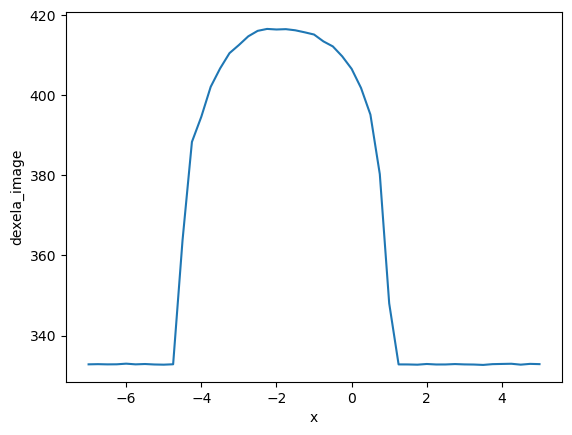

In [64]:
run = raw[-1]
data = run.primary.read()
data = data.set_index({"time": "mBaseX"})
data["time"].attrs["standard_name"] = "x"
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)
fig

In [66]:
XMIN1, XMAX1 = -4.8, 1.3

In [67]:
RE(bps.mv(mBaseY, 25))

()

In [68]:
plan = grid_scan_nd(
    [dexela_c, mBaseY, mBaseX], mBaseY, 25, 25, 1, mBaseX, 5, -7, 12 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="line scan to find the range at the top part"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 62     Time: 2021-07-26 22:57:07
Persistent Unique Scan ID: '99a6948d-7b92-4fd1-8ca3-9f551817b047'
New stream: 'primary'


/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/best_effort.py:313: RuntimeWarning: divide by zero encountered in double_scalars
  data_aspect_ratio = np.abs(data_range[1]/data_range[0])
/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/mpl_plotting.py:486: UserWarning: Attempting to set identical bottom == top == 25.0 results in singular transformations; automatically expanding.
  origin='lower')


+-----------+------------+------------+------------+---------------------+
|   seq_num |       time |     mBaseY |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+------------+---------------------+
|         1 | 22:58:08.7 |    25.0000 |     5.0000 |                   0 |
|         2 | 22:58:11.0 |    25.0000 |     4.7500 |                   0 |
|         3 | 22:58:13.2 |    25.0000 |     4.5000 |                   0 |
|         4 | 22:58:15.9 |    25.0000 |     4.2500 |                   0 |
|         5 | 22:58:18.4 |    25.0000 |     4.0000 |                   0 |
|         6 | 22:58:20.3 |    25.0000 |     3.7500 |                   0 |
|         7 | 22:58:22.4 |    25.0000 |     3.5000 |                   0 |
|         8 | 22:58:24.4 |    25.0000 |     3.2500 |                   0 |
|         9 | 22:58:26.4 |    25.0000 |     3.0000 |                   0 |
|        10 | 22:58:28.7 |    25.0000 |     2.7500 |                   0 |
|        11 | 22:58:31.1 

('99a6948d-7b92-4fd1-8ca3-9f551817b047',)

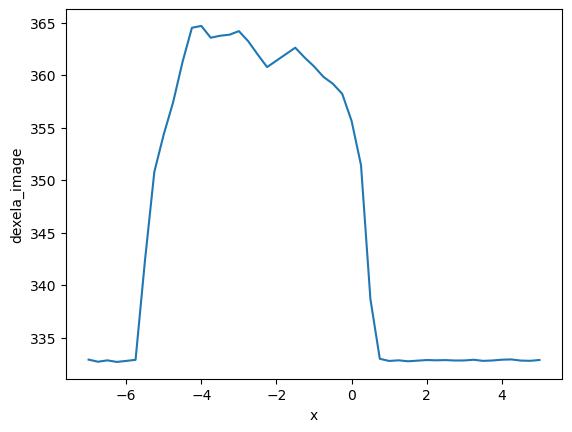

In [69]:
run = raw[-1]
data = run.primary.read()
data = data.set_index({"time": "mBaseX"})
data["time"].attrs["standard_name"] = "x"
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)
del data, run
fig

In [70]:
XMIN2, XMAX2 = -5.8, 0.8

In [71]:
RE(bps.mv(mBaseX, (XMIN2 + XMAX2) / 2.))

()

In [72]:
plan = grid_scan_nd(
    [dexela_c, mBaseY, mBaseX], mBaseY, 25, 25, 1, mBaseX, -2.5, -2.5, 1,
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="take one image at the center"),
    take_dark=True
)
RE(plan)



Transient Scan ID: 63     Time: 2021-07-26 23:02:18
Persistent Unique Scan ID: 'ea7cb7b8-d93c-4bf0-a73d-1e457894d70c'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+------------+------------+---------------------+
|   seq_num |       time |     mBaseY |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+------------+---------------------+
|         1 | 23:02:22.9 |    25.0000 |    -2.5000 |                   0 |
+-----------+------------+------------+------------+---------------------+
generator grid_scan ['ea7cb7b8'] (scan num: 63)





('ea7cb7b8-d93c-4bf0-a73d-1e457894d70c',)

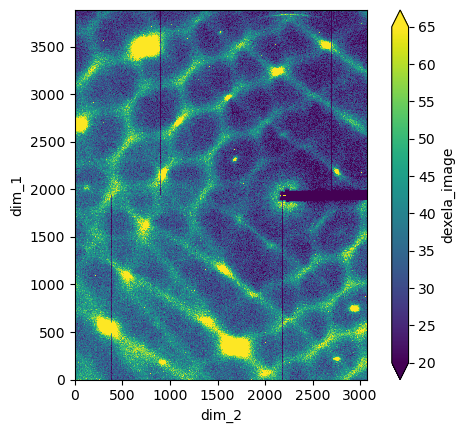

In [73]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

In [75]:
Filters.read()

OrderedDict([('fb_flt1', {'value': 'Out', 'timestamp': 1627352924.64022}),
             ('fb_flt2', {'value': 'Out', 'timestamp': 1627352924.640227}),
             ('fb_flt3', {'value': 'Out', 'timestamp': 1627352924.64023}),
             ('fb_flt4', {'value': 'Out', 'timestamp': 1627352924.640232})])

In [76]:
RE(
    bpp.pchain(
        bps.mv(Filters.flt1, "In"),
        bps.mv(Filters.flt2, "In"),
        bps.mv(Filters.flt3, "In"),
        bps.mv(Filters.flt4, "In")
    )
)

()

In [77]:
plan = grid_scan_nd(
    [dexela_c, mBaseY, mBaseX], mBaseY, 25, 25, 1, mBaseX, -2.5, -2.5, 1,
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="take one image at the center"),
    take_dark=True
)
RE(plan)



Transient Scan ID: 64     Time: 2021-07-26 23:05:00
Persistent Unique Scan ID: '7759487f-663b-4457-98dd-0a3d7efbef51'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+------------+------------+---------------------+
|   seq_num |       time |     mBaseY |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+------------+---------------------+
|         1 | 23:05:04.8 |    25.0000 |    -2.5000 |                   0 |
+-----------+------------+------------+------------+---------------------+
generator grid_scan ['7759487f'] (scan num: 64)





('7759487f-663b-4457-98dd-0a3d7efbef51',)

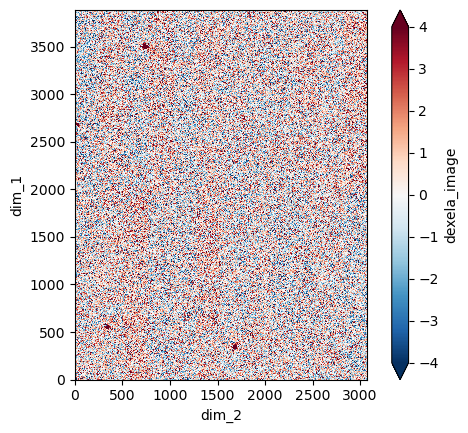

In [78]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

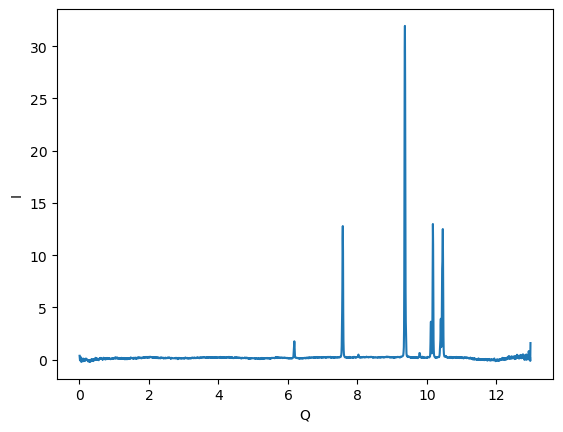

In [80]:
# dark subtraction and integrate to 1d line
ai = pyFAI.load("/nsls2/data/xpd/legacy/processed/from_mehmet/CeO2_0.25x0.25_beam.poni")
q, i = ai.integrate1d(subtracted.values, npt=2048, unit="q_A^-1")
i_data = xr.DataArray(i, coords={"Q": q}, dims=["Q"])
i_data.attrs.update({"standard_name": "I"})

fig, ax = plt.subplots()
i_data.plot.line(ax=ax)
plt.gcf()

In [81]:
YMIN = 41

In [82]:
mPhi.limits

(-91.0, 181.0)

In [83]:
mPhi.read()

OrderedDict([('mPhi',
              {'value': 179.99999999999994, 'timestamp': 1627345840.128467}),
             ('mPhi_user_setpoint',
              {'value': 180.0, 'timestamp': 1627345840.128467})])

In [88]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mBaseX, -2.5, -2.5, 1,
    mPhi, 180, 170, 101,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A quick rocking curve at the top"),
    take_dark=True
)
RE(plan)



Transient Scan ID: 66     Time: 2021-07-26 23:12:36
Persistent Unique Scan ID: 'c36dc914-733b-4689-9929-e94a3c0212ed'
New stream: 'dark'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 23:12:39.5 |   180.0000 |                   0 |
|         2 | 23:12:40.3 |   179.9000 |                   0 |
|         3 | 23:12:41.2 |   179.8000 |                   0 |
|         4 | 23:12:42.2 |   179.7000 |                   0 |
|         5 | 23:12:43.6 |   179.6000 |                   0 |
|         6 | 23:12:45.0 |   179.5000 |                   0 |
|         7 | 23:12:46.0 |   179.4000 |                   0 |
|         8 | 23:12:47.0 |   179.3000 |                   0 |
|         9 | 23:12:47.9 |   179.2000 |                   0 |
|        10 | 23:12:48.9 |   179.1000 |                   0 |
|        11 | 23:12:50.3 |   179.

('c36dc914-733b-4689-9929-e94a3c0212ed',)

In [89]:
RE(bps.mv(mPhi, 174.5))

()

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 174.5 - 1, 174.5 + 1, 801,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A quick rocking curve at the top in a fine grid"),
    take_dark=False
)
RE(plan)

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 174.5 - 1, 174.5 + 1, 801,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A quick rocking curve at the lower part in a fine grid"),
    take_dark=False
)
RE(plan)

In [ ]:
plan = fly_scan_nd(
    [dexela_c, mPhi],
    mBaseY, 35, 35, 1,
    mPhi, 90, 180, 91,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A quick rocking curve fly scan at the lower part in a coarse grid"),
    move_velocity=1.0,
    take_dark=False
)
summarize_plan(plan)

In [123]:
RE(bps.mv(Filters.flt3, "Out"))

()

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 174.5 - 1, 174.5 + 1, 801,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A quick rocking curve at the lower part in a fine grid, with filter 3 out."),
    take_dark=False
)
RE(plan)

In [147]:
plan = bp.list_grid_scan([mPhi], mPhi, [173.5, 175.5, 173.5, 175.5, 173.5, 175.5, 173.5, 175.5, 173.5, 175.5, 173.5, 175.5])
RE(plan)



Transient Scan ID: 74     Time: 2021-07-27 01:23:40
Persistent Unique Scan ID: 'd3f3b999-ab85-47a0-9a61-8f288f766ef3'
New stream: 'primary'
+-----------+------------+------------+
|   seq_num |       time |       mPhi |
+-----------+------------+------------+
|         1 | 01:23:41.1 |   173.5000 |
|         2 | 01:23:41.6 |   175.5000 |
|         3 | 01:23:42.2 |   173.5000 |
|         4 | 01:23:42.8 |   175.5000 |
|         5 | 01:23:43.3 |   173.5000 |
|         6 | 01:23:43.8 |   175.5000 |
|         7 | 01:23:44.3 |   173.5000 |
|         8 | 01:23:44.8 |   175.5000 |
|         9 | 01:23:45.3 |   173.5000 |
|        10 | 01:23:45.8 |   175.5000 |
|        11 | 01:23:46.3 |   173.5000 |
|        12 | 01:23:46.8 |   175.5000 |
+-----------+------------+------------+
generator list_grid_scan ['d3f3b999'] (scan num: 74)





('d3f3b999-ab85-47a0-9a61-8f288f766ef3',)

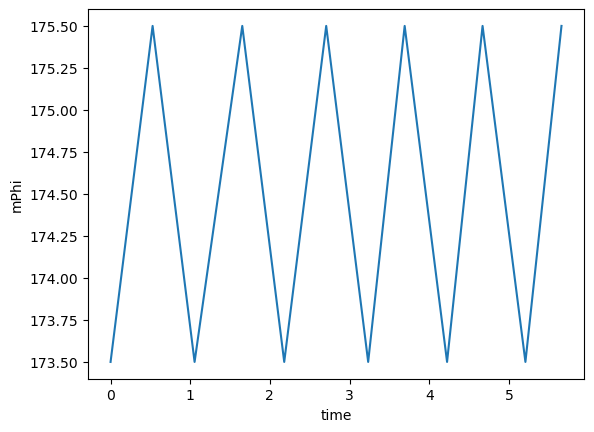

In [151]:
run = raw[-1]
data = run.primary.read()

fig, ax = plt.subplots()
data["time"] = data["time"] - data["time"].min()
data["mPhi"].plot.line(ax=ax)
plt.gcf()

In [159]:
RE(bps.mv(Filters.flt3, "In"))

()

In [160]:
Filters.read()

OrderedDict([('fb_flt1', {'value': 'In', 'timestamp': 1627360714.889417}),
             ('fb_flt2', {'value': 'In', 'timestamp': 1627355090.846958}),
             ('fb_flt3', {'value': 'In', 'timestamp': 1627363904.655862}),
             ('fb_flt4', {'value': 'In', 'timestamp': 1627355090.846963})])

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mBaseX, mBaseY],
    mBaseY, 21.5, 41, int(19.5 * 4 + 1),
    mBaseX, -6, 1.5, int(7.5 * 4 + 1),
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, all filters in."),
    take_dark=False
)
RE(plan)

In [163]:
RE(bps.mv(mBaseY, 21.5, mBaseX, -6))

()

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mBaseX, mBaseY],
    mBaseY, 21.5, 41, int(19.5 * 4 + 1),
    mBaseX, -6, 1.5, int(7.5 * 4 + 1),
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, filter 3 out."),
    take_dark=False
)
plan = bpp.pchain(
    bps.mv(Filters.flt3, "Out"),
    plan
)
RE(plan)

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mBaseX, mBaseY],
    mBaseY, 21.5, 41, int(19.5 * 4 + 1),
    mBaseX, -6, 1.5, int(7.5 * 4 + 1),
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, filter 3 and filter 2 out."),
    take_dark=False
)
plan = bpp.pchain(
    bps.mv(Filters.flt2, "Out"),
    plan
)
RE(plan)

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mBaseX, mBaseY],
    mBaseY, 21.5, 41, int(19.5 * 4 + 1),
    mBaseX, -6, 1.5, int(7.5 * 4 + 1),
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, all filters in again."),
    take_dark=False
)
plan = bpp.pchain(
    bps.mv(Filters.flt3, "In"),
    bps.mv(Filters.flt2, "In"),
    plan
)
RE(plan)

In [166]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 174.5 - 1, 174.5 + 1, 2 * 50 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A quick rocking curve at the lower part in a fine grid, with filter 3 out again to check."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 77     Time: 2021-07-27 02:05:00
Persistent Unique Scan ID: '5e4fec8e-05e0-44fb-931d-9610e9118920'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 02:05:01.8 |   173.5000 |                   0 |
|         2 | 02:05:03.0 |   173.5200 |                   0 |
|         3 | 02:05:03.9 |   173.5400 |                   0 |
|         4 | 02:05:04.9 |   173.5600 |                   0 |
|         5 | 02:05:06.4 |   173.5800 |                   0 |
|         6 | 02:05:07.2 |   173.6000 |                   0 |
|         7 | 02:05:08.1 |   173.6200 |                   0 |
|         8 | 02:05:09.4 |   173.6400 |                   0 |
|         9 | 02:05:10.4 |   173.6600 |                   0 |
|        10 | 02:05:11.2 |   173.6800 |                   0 |
|        11 | 02:05:12.2 |   173.7000 |             

/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/fitting.py:166: RuntimeWarning: invalid value encountered in double_scalars
  for dir in range(input.ndim)]


('5e4fec8e-05e0-44fb-931d-9610e9118920',)

In [180]:
RE(
    bpp.pchain(
        bps.mv(Filters.flt1, "In"),
        bps.mv(Filters.flt2, "In"),
        bps.mv(Filters.flt3, "Out"),
        bps.mv(Filters.flt4, "In"),
    )
)

()

In [ ]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, -6, -1.5, int(7.5 * 4 + 1),
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="Line scan to find x."),
    take_dark=False
)
RE(plan)

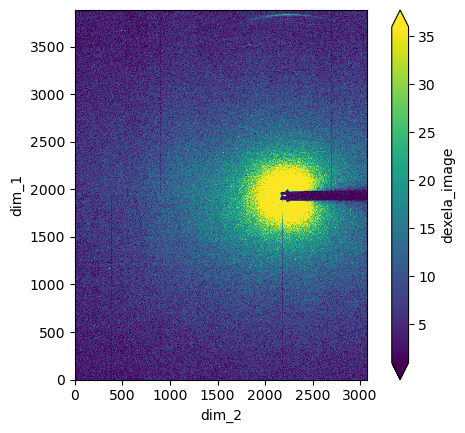

In [178]:
run = raw[-1]
data = run.primary.read()
dark = run.dark.read()

fig, ax = plt.subplots()
subtracted = data["dexela_image"].mean(dim=['time','dim_0']) - dark["dexela_image"].mean(dim=['time','dim_0'])
subtracted.plot.imshow(robust=True)
ax.set_aspect("equal")
plt.gcf()

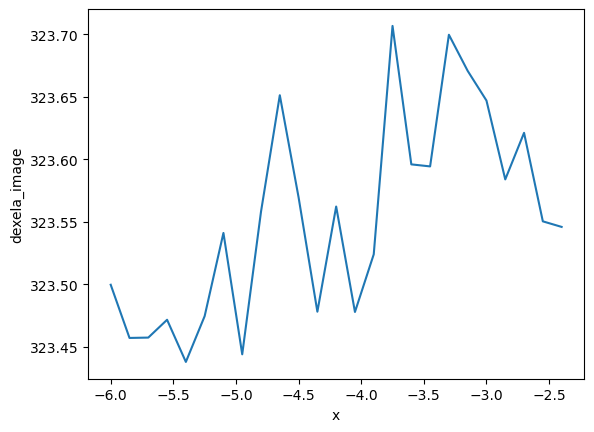

In [190]:
run = raw[-1]
data = run.primary.read()
data = data.set_index({"time": "mBaseX"})
data["time"].attrs["standard_name"] = "x"
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)
del data, run
fig

In [194]:
RE(
    bpp.pchain(
        bps.mv(Filters.flt1, "In"),
        bps.mv(Filters.flt2, "Out"),
        bps.mv(Filters.flt3, "Out"),
        bps.mv(Filters.flt4, "In"),
    )
)

()

In [195]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, -6, 1.5, int(7.5 * 4 + 1),
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="Line scan to find x."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 84     Time: 2021-07-27 02:27:55
Persistent Unique Scan ID: '23ae929f-516e-4e82-b21e-d63b88a7780a'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 02:28:05.7 |    -6.0000 |                   0 |
|         2 | 02:28:07.2 |    -5.7500 |                   0 |
|         3 | 02:28:09.0 |    -5.5000 |                   0 |
|         4 | 02:28:10.6 |    -5.2500 |                   0 |
|         5 | 02:28:12.1 |    -5.0000 |                   0 |
|         6 | 02:28:13.7 |    -4.7500 |                   0 |
|         7 | 02:28:15.4 |    -4.5000 |                   0 |
|         8 | 02:28:16.9 |    -4.2500 |                   0 |
|         9 | 02:28:18.4 |    -4.0000 |                   0 |
|        10 | 02:28:19.9 |    -3.7500 |                   0 |
|        11 | 02:28:21.4 |    -3.5000 |             

/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/fitting.py:166: RuntimeWarning: invalid value encountered in double_scalars
  for dir in range(input.ndim)]


ERROR:bluesky:Run aborted
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 1365, in _run
    msg = self._plan_stack[-1].send(resp)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 1307, in __call__
    return (yield from plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 1160, in baseline_wrapper
    return (yield from plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 803, in monitor_during_wrapper
    return (yield from plan2)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 170, in plan_mutator
    raise ex
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 123, in plan_mutator
    msg = plan_stack[-1].send(ret)
  File "/

FailedStatus: MoveStatus(done=True, pos=mBaseX, elapsed=0.0, success=False, settle_time=0.0)

ERROR:nslsii.ipython:MoveStatus(done=True, pos=mBaseX, elapsed=0.0, success=False, settle_time=0.0)
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-195-372f700c3975>", line 10, in <module>
    RE(plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 807, in __call__
    self._resume_task(init_func=_build_task)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 931, in _resume_task
    raise exc
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 1500, in _run
    raise err
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 1365, in _run
    msg = self._plan_stack[-1].send(resp)
  File "/opt/conda_

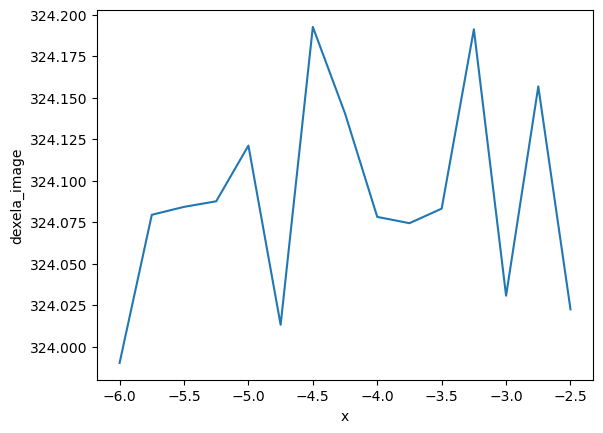

In [193]:
run = raw[-1]
data = run.primary.read()
data = data.set_index({"time": "mBaseX"})
data["time"].attrs["standard_name"] = "x"
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)
del data, run
fig

In [200]:
plan = grid_scan_nd(
    [dexela_c, mBaseY, mBaseX], mBaseY, 25, 25, 1, mBaseX, 55, 70, 16,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="line scan to find the range at the top part - again"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 85     Time: 2021-07-27 09:38:44
Persistent Unique Scan ID: 'b15032a8-6723-45aa-aa3c-4368385e9622'
New stream: 'primary'


/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/best_effort.py:313: RuntimeWarning: divide by zero encountered in double_scalars
  data_aspect_ratio = np.abs(data_range[1]/data_range[0])
/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/mpl_plotting.py:486: UserWarning: Attempting to set identical bottom == top == 25.0 results in singular transformations; automatically expanding.
  origin='lower')


+-----------+------------+------------+------------+---------------------+
|   seq_num |       time |     mBaseY |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+------------+---------------------+
|         1 | 09:39:35.2 |    25.0000 |    55.0000 |          3864274394 |
|         2 | 09:39:41.1 |    25.0000 |    56.0000 |          3864902879 |
|         3 | 09:39:46.9 |    25.0000 |    57.0000 |          3866306761 |
|         4 | 09:39:52.7 |    25.0000 |    58.0000 |          3866978305 |
|         5 | 09:39:58.7 |    25.0000 |    59.0000 |          3865803662 |
|         6 | 09:40:04.6 |    25.0000 |    60.0000 |          3866142123 |
|         7 | 09:40:10.8 |    25.0000 |    61.0000 |          3879488140 |
|         8 | 09:40:16.6 |    25.0000 |    62.0000 |          3895194744 |
|         9 | 09:40:22.4 |    25.0000 |    63.0000 |          3895956410 |
|        10 | 09:40:28.8 |    25.0000 |    64.0000 |          3894673190 |
|        11 | 09:40:35.0 

('b15032a8-6723-45aa-aa3c-4368385e9622',)

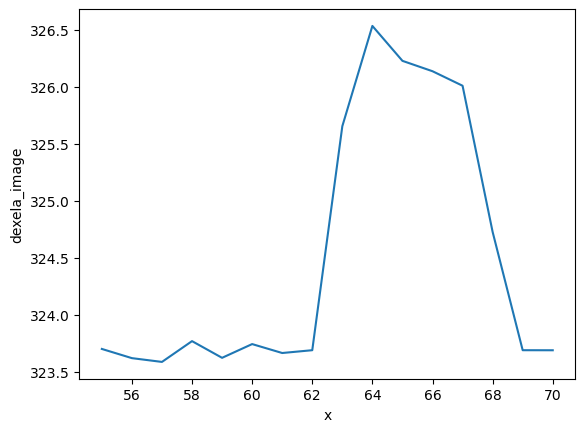

In [205]:
run = raw[-2]
data = run.primary.read()
data = data.set_index({"time": "mBaseX"})
data["time"].attrs["standard_name"] = "x"
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)
del data, run
fig

In [206]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mBaseX, 65, 65, 1,
    mPhi, 174.5 - 1, 174.5 + 1, 2 * 50 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=1., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A quick rocking curve at the lower part in a fine grid, with filter 3 out again to check."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 87     Time: 2021-07-27 09:46:33
Persistent Unique Scan ID: 'dc2c1cb3-3cd2-456c-af2c-260597d062fe'
New stream: 'primary'


/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/best_effort.py:313: RuntimeWarning: divide by zero encountered in double_scalars
  data_aspect_ratio = np.abs(data_range[1]/data_range[0])
/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/callbacks/mpl_plotting.py:486: UserWarning: Attempting to set identical bottom == top == 65.0 results in singular transformations; automatically expanding.
  origin='lower')


+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 09:46:59.7 |   173.5000 |          3895476194 |
|         2 | 09:47:01.0 |   173.5200 |          3902084634 |
|         3 | 09:47:02.1 |   173.5400 |          3905344202 |
|         4 | 09:47:03.0 |   173.5600 |          3904926088 |
|         5 | 09:47:03.9 |   173.5800 |          3905785057 |
|         6 | 09:47:04.8 |   173.6000 |          3901887988 |
|         7 | 09:47:06.2 |   173.6200 |          3889662961 |
|         8 | 09:47:07.1 |   173.6400 |          3889275511 |
|         9 | 09:47:08.1 |   173.6600 |          3891769139 |
|        10 | 09:47:08.9 |   173.6800 |          3891416250 |
|        11 | 09:47:09.8 |   173.7000 |          3894800750 |
|        12 | 09:47:10.8 |   173.7200 |          3893391582 |
|        13 | 09:47:11.8 |   173.7400 |          3891624880 |
|       

('dc2c1cb3-3cd2-456c-af2c-260597d062fe',)

In [208]:
plt.close()

In [ ]:
plan = fly_scan_nd(
    [dexela_c],
    mBaseY, 21.5, 41, int(19.5 * 4 + 1),
    mBaseX, 61.5, 69.5, int(8 * 4 + 1),
    mPhi, 173.5, 175.5, 1,
    move_velocity=2.,
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, filter 3 out."),
    take_dark=False
)
plan = bpp.pchain(
    bps.mv(Filters.flt1, "In"),
    bps.mv(Filters.flt2, "In"),
    bps.mv(Filters.flt3, "Out"),
    bps.mv(Filters.flt3, "In"),
    plan
)
RE(plan)



Transient Scan ID: 89     Time: 2021-07-27 10:00:36
Persistent Unique Scan ID: 'c9a929da-7f55-41f9-a4ff-2898a470663e'
New stream: 'primary'


In [10]:
plan = fly_scan_nd(
    [dexela_c],
    mBaseY, 32.25, 41, int((41 - 32.25) * 4 + 1),
    mBaseX, 61.5, 69.5, int(8 * 4 + 1),
    mPhi, 173.5, 175.5, 1,
    move_velocity=2.,
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, filter 3 out. Continue from the last terminated scan."),
    take_dark=False
)
plan = bpp.pchain(
    bps.mv(Filters.flt1, "In"),
    bps.mv(Filters.flt2, "In"),
    bps.mv(Filters.flt3, "Out"),
    bps.mv(Filters.flt3, "In"),
    plan
)
RE(plan)



Transient Scan ID: 90     Time: 2021-07-27 12:05:14
Persistent Unique Scan ID: 'd1880c33-0250-4e37-ba24-d1fbf55409bd'
New stream: 'primary'





('d1880c33-0250-4e37-ba24-d1fbf55409bd',)

In [12]:

def slitted_beam():

    mSlitsTop.move(0.125)
    mSlitsBottom.move(0.125)
    mSlitsOutboard.move(0.125)
    mSlitsInboard.move(0.125)
    
    mSigrayY.move(38.10016)
    
    
def focused_beam():

    mSlitsTop.move(0.5)
    mSlitsBottom.move(0.5)
    mSlitsOutboard.move(0.5)
    mSlitsInboard.move(0.5)
    
    mSigrayY.move(38.10016+12.5)    
    
    

In [13]:
RE(bps.mv(mBaseX.velocity, 0.4))

()

In [14]:
plan = fly_scan_nd(
    [dexela_c],
    mBaseY, 33, 41, int(8 * 2 + 1),
    mBaseX, 61.5, 69.5, int(8 * 4 + 1),
    mPhi, 173.5, 175.5, 1,
    move_velocity=4,
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, filter 3 out. In the transferring the ."),
    take_dark=False
)
plan = bpp.pchain(
    bps.mv(Filters.flt1, "In"),
    bps.mv(Filters.flt2, "In"),
    bps.mv(Filters.flt3, "Out"),
    bps.mv(Filters.flt3, "In"),
    plan
)
RE(plan)



Transient Scan ID: 91     Time: 2021-07-27 14:05:07
Persistent Unique Scan ID: 'a6751e1e-cb15-42f7-af74-2045445e45a2'
New stream: 'primary'
A 'deferred pause' has been requested. The RunEngine will pause at the next checkpoint. To pause immediately, hit Ctrl+C again in the next 10 seconds.Deferred pause acknowledged. Continuing to checkpoint.

trying a second time
Pausing...


An exception has occurred, use '%tb verbose' to see the full traceback.


RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.



Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-14-a7faa0213976>", line 20, in <module>
    RE(plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 810, in __call__
    raise RunEngineInterrupted(self.pause_msg) from None
bluesky.utils.RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume th

In [18]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 33, 41, int(8 * 2 + 1),
    mBaseX, 61.5, 69.5, int(8 * 4 + 1),
    mPhi, 173.5, 175.5, 1,
    move_velocity=4,
    time_per_point=1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, filter 3 out. In the transferring the ."),
    take_dark=False
)
plan = bpp.pchain(
    bps.mv(Filters.flt1, "In"),
    bps.mv(Filters.flt2, "In"),
    bps.mv(Filters.flt3, "Out"),
    bps.mv(Filters.flt3, "In"),
    plan
)
RE(plan)



Transient Scan ID: 92     Time: 2021-07-27 14:12:20
Persistent Unique Scan ID: '520e9e4a-c4b0-4fe6-ba6f-f53c8605c3d6'
New stream: 'primary'
A 'deferred pause' has been requested. The RunEngine will pause at the next checkpoint. To pause immediately, hit Ctrl+C again in the next 10 seconds.Deferred pause acknowledged. Continuing to checkpoint.

trying a second time
Pausing...


An exception has occurred, use '%tb verbose' to see the full traceback.


RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.



Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-18-b4d18aaa9350>", line 20, in <module>
    RE(plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 810, in __call__
    raise RunEngineInterrupted(self.pause_msg) from None
bluesky.utils.RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume th

In [23]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 33, 41, int(8 * 4 + 1),
    mBaseX, 61.5, 69.5, int(8 * 4 + 1),
    mPhi, 173.5, 175.5, 1,
    move_velocity=4,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE1, task="A grid scan with precession on the whole rod, filter 3 out. In the transferring the ."),
    take_dark=False
)
plan = bpp.pchain(
    bps.mv(Filters.flt1, "In"),
    bps.mv(Filters.flt2, "In"),
    bps.mv(Filters.flt3, "Out"),
    bps.mv(Filters.flt3, "In"),
    plan
)
RE(plan)



Transient Scan ID: 93     Time: 2021-07-27 14:16:01
Persistent Unique Scan ID: 'a36c9369-8162-4117-8910-cd186a2f2a12'
New stream: 'primary'





('a36c9369-8162-4117-8910-cd186a2f2a12',)

In [30]:
plan = bp.count([dexela_c], md=dict(**SAMPLE2, task="collect the dark for 1 s."))
RE(plan)



Transient Scan ID: 94     Time: 2021-07-27 16:00:04
Persistent Unique Scan ID: '313035da-bf62-45fa-a0ea-a7bcb3604c8a'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 16:00:05.9 |          3850849680 |
+-----------+------------+---------------------+
generator count ['313035da'] (scan num: 94)





('313035da-bf62-45fa-a0ea-a7bcb3604c8a',)

In [34]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, -1, 1, 801,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A fine resolution rocking curve at the center."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 95     Time: 2021-07-27 16:02:15
Persistent Unique Scan ID: '2caba885-1306-4bcb-8f5e-121b5b22d485'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 16:02:16.2 |    -1.0000 |          3851618670 |
|         2 | 16:02:17.2 |    -0.9975 |          3851640449 |
|         3 | 16:02:18.1 |    -0.9950 |          3852469476 |
|         4 | 16:02:19.0 |    -0.9925 |          3853044552 |
|         5 | 16:02:20.0 |    -0.9900 |          3852332022 |
|         6 | 16:02:20.9 |    -0.9875 |          3853077740 |
|         7 | 16:02:22.0 |    -0.9850 |          3852432249 |
|         8 | 16:02:22.9 |    -0.9825 |          3852891331 |
|         9 | 16:02:24.0 |    -0.9800 |          3852766536 |
|        10 | 16:02:25.0 |    -0.9775 |          3852228864 |
|        11 | 16:02:26.1 |    -0.9750 |          385

An exception has occurred, use '%tb verbose' to see the full traceback.


RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.



Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-34-1718e6d9dc77>", line 10, in <module>
    RE(plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 810, in __call__
    raise RunEngineInterrupted(self.pause_msg) from None
bluesky.utils.RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume th

In [36]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, 69.5, 61.5, 8 * 2 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A line scan in x direction to determine the range."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 96     Time: 2021-07-27 16:08:04
Persistent Unique Scan ID: '98cfadfe-4675-41f0-9529-445827b47c36'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 16:08:04.9 |    69.5000 |          3854996569 |
|         2 | 16:08:07.0 |    69.0000 |          3854049381 |
|         3 | 16:08:09.0 |    68.5000 |          3854291553 |
|         4 | 16:08:11.2 |    68.0000 |          3853653214 |
|         5 | 16:08:13.4 |    67.5000 |          3853046581 |
|         6 | 16:08:15.3 |    67.0000 |          3852440058 |
|         7 | 16:08:17.3 |    66.5000 |          3852867779 |
|         8 | 16:08:19.3 |    66.0000 |          3853928670 |
|         9 | 16:08:21.3 |    65.5000 |          3854837031 |
|        10 | 16:08:23.3 |    65.0000 |          3856095925 |
|        11 | 16:08:25.3 |    64.5000 |          385

('98cfadfe-4675-41f0-9529-445827b47c36',)

In [37]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, 61.5, 69.5, 8 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A line scan in x direction to determine the range at the powder parts."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 97     Time: 2021-07-27 16:18:22
Persistent Unique Scan ID: '8f7a813c-83c4-4d34-8936-9e17919c66b9'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 16:18:23.4 |    61.5000 |          3858511619 |
|         2 | 16:18:24.9 |    61.7500 |          3857994570 |
|         3 | 16:18:26.4 |    62.0000 |          3859610337 |
|         4 | 16:18:27.9 |    62.2500 |          3859473469 |
|         5 | 16:18:29.3 |    62.5000 |          3858916292 |
|         6 | 16:18:30.9 |    62.7500 |          3859730516 |
|         7 | 16:18:32.3 |    63.0000 |          3860800210 |
|         8 | 16:18:33.8 |    63.2500 |          3859317560 |
|         9 | 16:18:35.2 |    63.5000 |          3859350884 |
|        10 | 16:18:36.7 |    63.7500 |          3858617832 |
|        11 | 16:18:38.2 |    64.0000 |          385

('8f7a813c-83c4-4d34-8936-9e17919c66b9',)

In [38]:
def change_filters(s1, s2, s3, s4):
    yield from bpp.pchain(
        bps.mv(Filters.flt1, s1),
        bps.mv(Filters.flt2, s2),
        bps.mv(Filters.flt3, s3),
        bps.mv(Filters.flt4, s4),
    )

In [41]:
RE(change_filters("In", "Out", "Out", "In"))

()

In [42]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, 58.5, 69.5, 11 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A line scan in x direction to determine the range at the powder parts."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 98     Time: 2021-07-27 16:22:43
Persistent Unique Scan ID: '8033edaa-adca-4535-8d93-1b0471ff8476'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 16:23:12.3 |    58.5000 |          3863092312 |
|         2 | 16:23:13.8 |    58.7500 |          3864499462 |
|         3 | 16:23:15.2 |    59.0000 |          3863806610 |
|         4 | 16:23:17.1 |    59.2500 |          3864385715 |
|         5 | 16:23:18.7 |    59.5000 |          3863932230 |
|         6 | 16:23:20.0 |    59.7500 |          3864279140 |
|         7 | 16:23:21.4 |    60.0000 |          3864263782 |
|         8 | 16:23:22.9 |    60.2500 |          3865603018 |
|         9 | 16:23:24.4 |    60.5000 |          3864409219 |
|        10 | 16:23:25.9 |    60.7500 |          3864891812 |
|        11 | 16:23:27.9 |    61.0000 |          386

('8033edaa-adca-4535-8d93-1b0471ff8476',)

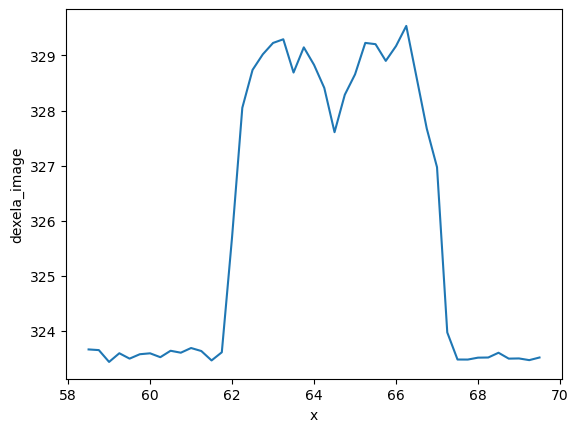

In [43]:
run = raw[-1]
data = run.primary.read()
data = data.set_index({"time": "mBaseX"})
data["time"].attrs["standard_name"] = "x"
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)
del data, run
fig

In [44]:
RE(change_filters("In", "In", "Out", "In"))

()

In [45]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, -1, 1, 801,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A fine resolution rocking curve at the center again."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 99     Time: 2021-07-27 16:37:39
Persistent Unique Scan ID: 'becb426c-a3e8-442b-913f-01fc16dfe762'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 16:37:40.4 |    -1.0000 |          3867235153 |
|         2 | 16:37:41.4 |    -0.9975 |          3867781916 |
|         3 | 16:37:42.4 |    -0.9950 |          3867100845 |
|         4 | 16:37:43.3 |    -0.9925 |          3867993574 |
|         5 | 16:37:44.6 |    -0.9900 |          3866774578 |
|         6 | 16:37:45.7 |    -0.9875 |          3867095681 |
|         7 | 16:37:46.8 |    -0.9850 |          3867138720 |
|         8 | 16:37:47.8 |    -0.9825 |          3865659326 |
|         9 | 16:37:48.9 |    -0.9800 |          3866759260 |
|        10 | 16:37:50.0 |    -0.9775 |          3867693794 |
|        11 | 16:37:50.9 |    -0.9750 |          386

('becb426c-a3e8-442b-913f-01fc16dfe762',)

In [46]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 45 - 1, 45 + 1, 801,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A fine resolution rocking curve at the center around another angle 45 deg."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 100     Time: 2021-07-27 16:52:14
Persistent Unique Scan ID: '7a7fc1bc-16eb-4f60-837e-2ffca6e7c41a'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 16:52:15.7 |    44.0000 |          3867232261 |
|         2 | 16:52:16.8 |    44.0025 |          3868221001 |
|         3 | 16:52:18.1 |    44.0050 |          3866928303 |
|         4 | 16:52:19.0 |    44.0075 |          3867900662 |
|         5 | 16:52:20.3 |    44.0100 |          3868146478 |
|         6 | 16:52:21.3 |    44.0125 |          3868539058 |
|         7 | 16:52:22.3 |    44.0150 |          3867293033 |
|         8 | 16:52:23.3 |    44.0175 |          3867860086 |
|         9 | 16:52:24.2 |    44.0200 |          3867591179 |
|        10 | 16:52:25.0 |    44.0225 |          3867426529 |
|        11 | 16:52:25.9 |    44.0250 |          38

An exception has occurred, use '%tb verbose' to see the full traceback.


RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.



Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-46-fb5d43cd3db7>", line 10, in <module>
    RE(plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 810, in __call__
    raise RunEngineInterrupted(self.pause_msg) from None
bluesky.utils.RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume th

In [49]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 45, 45 + 1, 401,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A fine resolution rocking curve at the center around another angle 45 deg. Continue last scan from 45."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 101     Time: 2021-07-27 17:10:00
Persistent Unique Scan ID: 'd73ebc8e-d5b7-4ac1-8f82-95aa2414f2b3'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 17:10:02.5 |    45.0000 |          3869836911 |
|         2 | 17:10:03.6 |    45.0025 |          3870276820 |
|         3 | 17:10:04.9 |    45.0050 |          3868810234 |
|         4 | 17:10:06.2 |    45.0075 |          3869364752 |
|         5 | 17:10:07.3 |    45.0100 |          3870817129 |
|         6 | 17:10:08.6 |    45.0125 |          3870126569 |
|         7 | 17:10:10.0 |    45.0150 |          3869481763 |
|         8 | 17:10:11.1 |    45.0175 |          3868924300 |
|         9 | 17:10:12.2 |    45.0200 |          3868896223 |
|        10 | 17:10:13.7 |    45.0225 |          3869664235 |
|        11 | 17:10:14.7 |    45.0250 |          38

('d73ebc8e-d5b7-4ac1-8f82-95aa2414f2b3',)

In [11]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 28., 43., 15 * 4 + 1,
    mBaseX, 61., 68., 7 * 4 + 1,
    mPhi, -1., 1., 1,
    move_velocity=8.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A grid scan with precession on the whole rod, filter 3 out, in the region of transition."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 117     Time: 2021-07-27 18:21:43
Persistent Unique Scan ID: '9dd747af-bdb8-449f-a5e1-a8e0a55b1410'
A 'deferred pause' has been requested. The RunEngine will pause at the next checkpoint. To pause immediately, hit Ctrl+C again in the next 10 seconds.Deferred pause acknowledged. Continuing to checkpoint.

trying a second time
Pausing...


An exception has occurred, use '%tb verbose' to see the full traceback.


RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.



Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-11-d68860a9b666>", line 13, in <module>
    RE(plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 810, in __call__
    raise RunEngineInterrupted(self.pause_msg) from None
bluesky.utils.RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume th



Transient Scan ID: 126     Time: 2021-07-27 19:14:57
Persistent Unique Scan ID: '57a0b1ad-f44c-4a22-abd2-cfabea066c43'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 19:14:59.0 |          4793524558 |
|         2 | 19:15:00.0 |          4793170950 |
|         3 | 19:15:01.1 |          4793834493 |
|         4 | 19:15:02.0 |          4793836468 |
|         5 | 19:15:03.0 |          4793389454 |
|         6 | 19:15:04.1 |          4794139735 |
|         7 | 19:15:05.0 |          4793145433 |
|         8 | 19:15:06.0 |          4792806390 |
|         9 | 19:15:07.1 |          4792715616 |
|        10 | 19:15:08.0 |          4792506224 |
+-----------+------------+---------------------+
generator count ['57a0b1ad'] (scan num: 126)



CPU times: user 453 ms, sys: 30.3 ms, total: 483 ms
Wall time: 10.4 s


('57a0b1ad-f44c-4a22-abd2-cfabea066c43',)

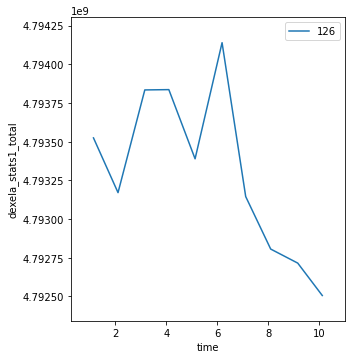

In [37]:

def mehmet_configure_area_det(det,acq_time,exposure,num_exposure=1):
    
    if det.cam.acquire.get() == 0:
        yield from bps.abs_set(det.cam.acquire, 1, wait=True)

    yield from bps.abs_set(det.cam.acquire_time, acq_time, wait=True)
    acq_time = det.cam.acquire_time.get()

    num_frame = np.ceil(exposure / acq_time)
    
    yield from bps.abs_set(det.images_per_set, num_frame, wait=True)
    
    yield from bps.abs_set(det.number_of_sets, num_exposure, wait=True)    

    print("{} is configured as: acq_time = {}; exposure = {} (num frames = {}); num_exposure = {}".format(det.name,det.cam.acquire_time.get(),exposure,num_frame,num_exposure))  
    
    
    return 



det = dexela_c
mehmet_configure_area_det(det,acq_time=1,exposure=1,num_exposure=1)
%time RE(bp.count([dexela_c], 10))

In [12]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 28., 43., 15 * 4 + 1,
    mBaseX, 61., 68., 7 * 4 + 1,
    mPhi, -1., 1., 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A grid scan with precession on the whole rod, filter 3 out, in the region of transition."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 127     Time: 2021-07-27 19:25:29
Persistent Unique Scan ID: 'fef1f2f7-301c-41c6-a775-d89e1fe0af23'
New stream: 'primary'





('fef1f2f7-301c-41c6-a775-d89e1fe0af23',)

## sample 3 CG

Y = 43 mm

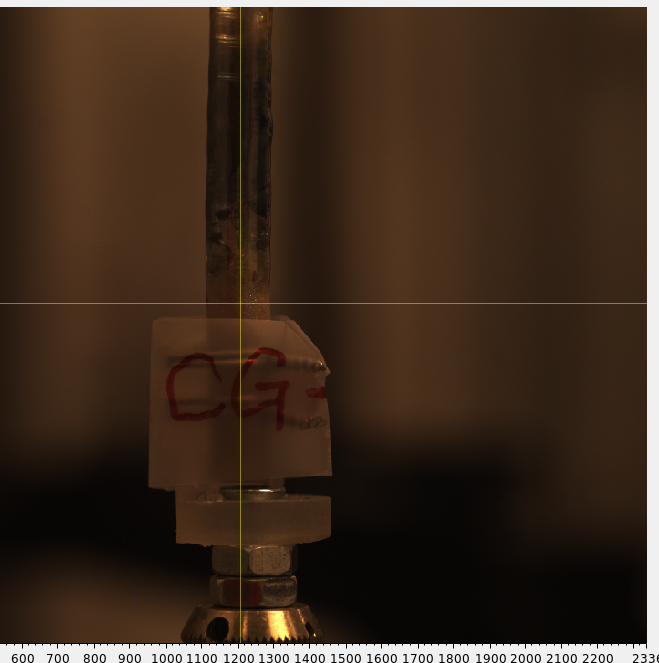



Transient Scan ID: 128     Time: 2021-07-27 21:28:03
Persistent Unique Scan ID: '5a4aaad0-a9dd-4e17-9301-7a118b68f32b'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 21:28:04.1 |    58.5000 |          3856573268 |
|         2 | 21:28:05.7 |    58.7500 |          3858386731 |
|         3 | 21:28:07.1 |    59.0000 |          3858146772 |
|         4 | 21:28:08.7 |    59.2500 |          3856956992 |
|         5 | 21:28:10.2 |    59.5000 |          3857630427 |
|         6 | 21:28:11.9 |    59.7500 |          3856580490 |
|         7 | 21:28:13.4 |    60.0000 |          3858009089 |
|         8 | 21:28:14.9 |    60.2500 |          3858693687 |
|         9 | 21:28:16.3 |    60.5000 |          3858979899 |
|        10 | 21:28:18.1 |    60.7500 |          3858471370 |
|        11 | 21:28:20.0 |    61.0000 |          38

('5a4aaad0-a9dd-4e17-9301-7a118b68f32b',)

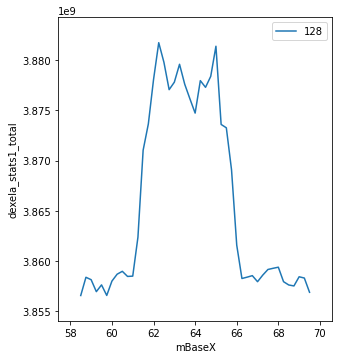

In [14]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, 58.5, 69.5, 11 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE3, task="A line scan in x direction to determine the range at the powder parts."),
    take_dark=False
)
RE(plan)

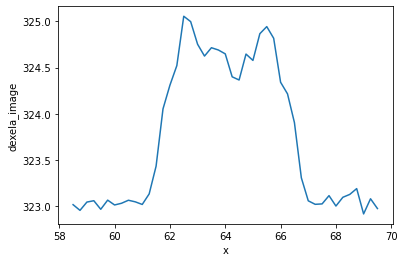

In [16]:
run = raw[-1]
data = run.primary.read()
data = data.set_index({"time": "mBaseX"})
data["time"].attrs["standard_name"] = "x"
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)
del data, run

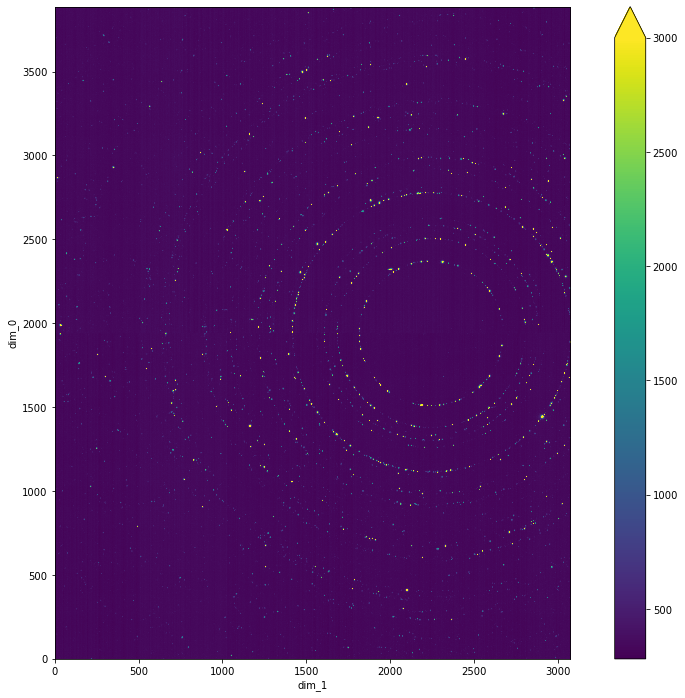

In [26]:
image = np.load("/nsls2/data/xpd/legacy/processed/xpdUser/tiff_base/CG-0032_5a4aaad0-a9dd-4e17-9301-7a118b68f32b/max/CG-0032_44_max.npy")
fig, ax = plt.subplots(figsize=(8 * 2, 6 * 2))
xr.DataArray(image).plot.imshow(vmax=3000, ax=ax)
ax.set_aspect("equal")
del image



Transient Scan ID: 129     Time: 2021-07-27 21:32:24
Persistent Unique Scan ID: '61e69a6a-4fb2-44b2-b784-7d2fbe067ea9'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 21:32:25.0 |    58.5000 |          3858756452 |
|         2 | 21:32:26.8 |    58.7500 |          3857780912 |
|         3 | 21:32:28.2 |    59.0000 |          3857100929 |
|         4 | 21:32:29.7 |    59.2500 |          3858570491 |
|         5 | 21:32:31.1 |    59.5000 |          3858563594 |
|         6 | 21:32:33.0 |    59.7500 |          3858353142 |
|         7 | 21:32:34.6 |    60.0000 |          3858140211 |
|         8 | 21:32:36.1 |    60.2500 |          3859125628 |
|         9 | 21:32:37.6 |    60.5000 |          3856346127 |
|        10 | 21:32:39.0 |    60.7500 |          3858381487 |
|        11 | 21:32:40.7 |    61.0000 |          38

('61e69a6a-4fb2-44b2-b784-7d2fbe067ea9',)

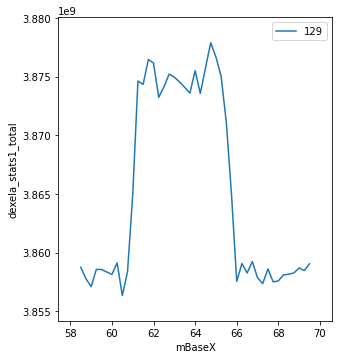

In [17]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, 58.5, 69.5, 11 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE3, task="A line scan in x direction to determine the range at the powder parts at 90 deg."),
    take_dark=False
)
RE(plan)

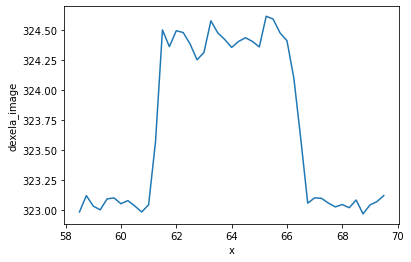

In [18]:
run = raw[-1]
data = run.primary.read()
data = data.set_index({"time": "mBaseX"})
data["time"].attrs["standard_name"] = "x"
fig, ax = plt.subplots()
data["dexela_image"].mean(axis=(-3, -2, -1)).plot.line(ax=ax)
del data, run

Move up to Y = 29.0 mm

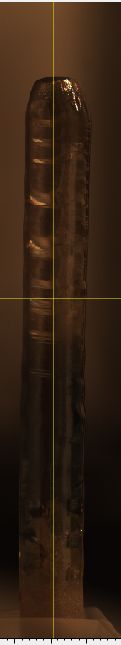



Transient Scan ID: 130     Time: 2021-07-27 21:45:35
Persistent Unique Scan ID: 'd356b0d8-6090-4bd4-9e39-e8bd2c32431e'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 21:45:35.8 |    -1.0000 |          3871608632 |
|         2 | 21:45:36.9 |    -0.9975 |          3872976885 |
|         3 | 21:45:38.0 |    -0.9950 |          3872233484 |
|         4 | 21:45:39.2 |    -0.9925 |          3872315806 |
|         5 | 21:45:40.7 |    -0.9900 |          3872762577 |
|         6 | 21:45:41.7 |    -0.9875 |          3872015031 |
|         7 | 21:45:42.8 |    -0.9850 |          3871103054 |
|         8 | 21:45:43.8 |    -0.9825 |          3872625273 |
|         9 | 21:45:45.0 |    -0.9800 |          3872373082 |
|        10 | 21:45:45.9 |    -0.9775 |          3875324590 |
|        11 | 21:45:46.9 |    -0.9750 |          38

('d356b0d8-6090-4bd4-9e39-e8bd2c32431e',)

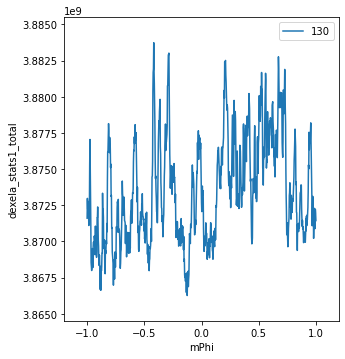

In [27]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 0 - 1, 0 + 1, 801,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE3, task="A fine resolution rocking curve at the center around another angle 0 deg."),
    take_dark=False
)
RE(plan)

Move to Y = 9.00 mm

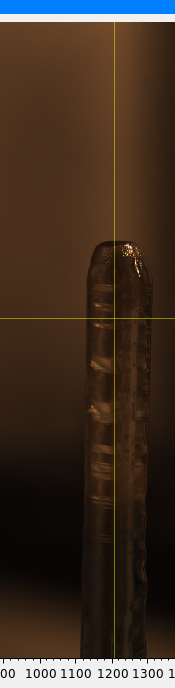

In [31]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 9., 43., 34 * 4 + 1,
    mBaseX, 60.5, 67.5, 7 * 4 + 1,
    mPhi, -1., 1., 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE3, task="A grid scan with precession on the whole rod at 0 deg"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 131     Time: 2021-07-27 22:10:09
Persistent Unique Scan ID: 'cb427382-2015-41b8-8d6d-aad41d84488d'
New stream: 'primary'





('cb427382-2015-41b8-8d6d-aad41d84488d',)



Transient Scan ID: 132     Time: 2021-07-28 00:51:12
Persistent Unique Scan ID: '4343617a-1940-46da-ac1b-77e348ba6944'
New stream: 'primary'
+-----------+------------+---------------------+
|   seq_num |       time | dexela_stats1_total |
+-----------+------------+---------------------+
|         1 | 00:51:13.9 |          3868515321 |
|         2 | 00:51:14.9 |          3868867779 |
|         3 | 00:51:15.9 |          3868700120 |
|         4 | 00:51:16.4 |          3868423594 |
|         5 | 00:51:16.9 |          3868586776 |
|         6 | 00:51:17.9 |          3867170089 |
|         7 | 00:51:18.4 |          3868301107 |
|         8 | 00:51:18.9 |          3867908499 |
|         9 | 00:51:19.4 |          3867474383 |
|        10 | 00:51:20.2 |          3867748287 |
+-----------+------------+---------------------+
generator count ['4343617a'] (scan num: 132)





('4343617a-1940-46da-ac1b-77e348ba6944',)

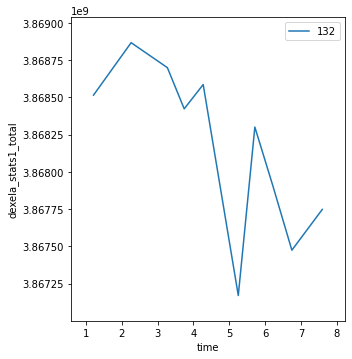

In [32]:
RE(bp.count([dexela_c], num=10, md={"task": "collect the dark image."}))

In [33]:
RE(bps.mv(mBaseY, 32.0))
RE(bps.mv(mBaseX, 60.5))
RE(bps.mv(mPhi, 89.0))

()

In [35]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 32., 43., 11 * 4 + 1,
    mBaseX, 60.5, 67.5, 7 * 4 + 1,
    mPhi, 89., 91., 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE3, task="A grid scan with precession on the lower part of rod at 90 deg"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 133     Time: 2021-07-28 00:57:48
Persistent Unique Scan ID: '875dcf3a-ccaa-4b20-bffe-a452c5466bac'
New stream: 'primary'





('875dcf3a-ccaa-4b20-bffe-a452c5466bac',)

## Sample 4

Determine the x positions

Y = 41 mm

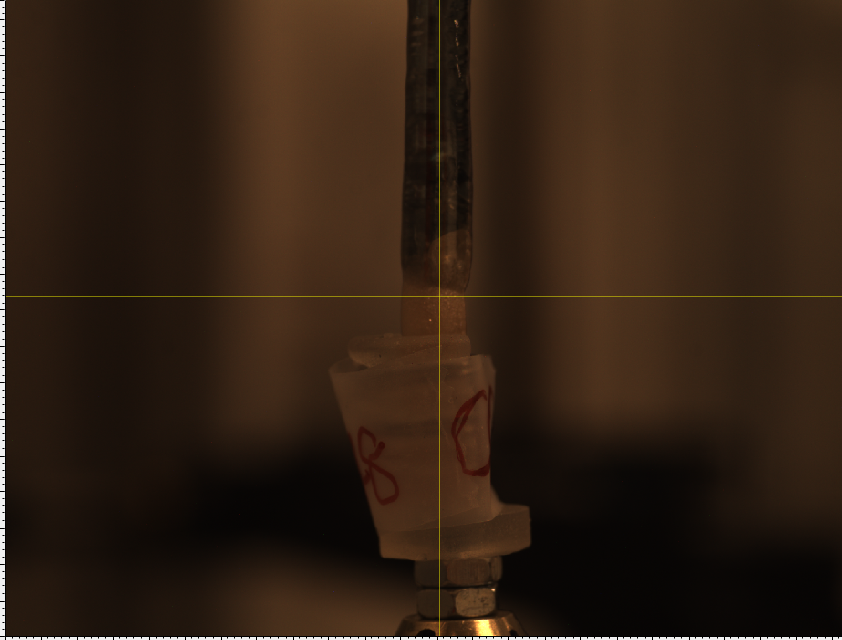



Transient Scan ID: 134     Time: 2021-07-28 02:32:15
Persistent Unique Scan ID: '69e00f8b-e6f5-4ac0-b513-6afc4415808b'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 02:32:39.2 |    58.5000 |          3859866025 |
|         2 | 02:32:41.0 |    58.7500 |          3860529351 |
|         3 | 02:32:42.6 |    59.0000 |          3862026684 |
|         4 | 02:32:44.3 |    59.2500 |          3861211436 |
|         5 | 02:32:45.8 |    59.5000 |          3861022411 |
|         6 | 02:32:47.2 |    59.7500 |          3861549731 |
|         7 | 02:32:49.0 |    60.0000 |          3862010293 |
|         8 | 02:32:50.6 |    60.2500 |          3861292476 |
|         9 | 02:32:52.0 |    60.5000 |          3859660389 |
|        10 | 02:32:53.3 |    60.7500 |          3864562902 |
|        11 | 02:32:54.9 |    61.0000 |          38

('69e00f8b-e6f5-4ac0-b513-6afc4415808b',)

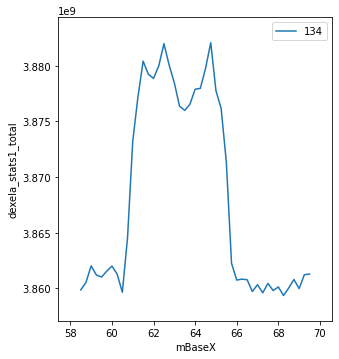

In [45]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, 58.5, 69.5, 11 * 4 + 1,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE4, task="A line scan in x direction to determine the range at the powder parts."),
    take_dark=False
)
RE(plan)

In [46]:
RE(bps.mv(mBaseY, 9.0, mBaseX, 59.0, mPhi, -1.0))

()

In [47]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 9.0, 42.0, 33 * 4 + 1,
    mBaseX, 59.0, 67.0, 8 * 4 + 1,
    mPhi, -1.0, 1.0, 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE4, task="A grid scan with precession on the whole rod of rod at 0 deg"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 135     Time: 2021-07-28 02:53:49
Persistent Unique Scan ID: 'b266cb75-2bca-49d4-92de-bbd56a4f7291'
New stream: 'primary'





('b266cb75-2bca-49d4-92de-bbd56a4f7291',)

In [48]:
RE(bps.mv(mBaseY, 29.0, mBaseX, 59.0, mPhi, 89.0))

()

In [49]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 29.0, 42.0, 13 * 4 + 1,
    mBaseX, 59.0, 67.0, 8 * 4 + 1,
    mPhi, 89.0, 91.0, 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE4, task="A grid scan with precession on the lower part of rod at 90 deg"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 136     Time: 2021-07-28 05:56:48
Persistent Unique Scan ID: '650f8afa-7d0b-4e6e-85b0-b8e0c9ac1bfe'
New stream: 'primary'





('650f8afa-7d0b-4e6e-85b0-b8e0c9ac1bfe',)

In [50]:
RE(bps.mv(mBaseY, 15.0, mBaseX, 62.0, mPhi, -1.0))

()

In [51]:
plan = grid_scan_nd(
    [dexela_c, mBaseX, mBaseY, mPhi],
    mBaseY, 15.0, 35.0, 4,
    mBaseX, 62.0, 65.0, 4,
    mPhi, -1.0, 1.0, 401,
    time_per_point=0.1, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE4, task="A coarse grid rocking curve at the center around another angle 0 deg."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 137     Time: 2021-07-28 07:18:13
Persistent Unique Scan ID: '70273aba-d414-4f9b-8548-e065f8f95c5f'
New stream: 'primary'
A 'deferred pause' has been requested. The RunEngine will pause at the next checkpoint. To pause immediately, hit Ctrl+C again in the next 10 seconds.Deferred pause acknowledged. Continuing to checkpoint.

A 'deferred pause' has been requested. The RunEngine will pause at the next checkpoint. To pause immediately, hit Ctrl+C again in the next 10 seconds.Deferred pause acknowledged. Continuing to checkpoint.

trying a second time
Pausing...


An exception has occurred, use '%tb verbose' to see the full traceback.


RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.



Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-51-ec7e96ca64fd>", line 12, in <module>
    RE(plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 810, in __call__
    raise RunEngineInterrupted(self.pause_msg) from None
bluesky.utils.RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume th

In [54]:
RE(bps.mv(mBaseY, 15.0, mBaseX, 62.0, mPhi, 89.0))

()

In [57]:
plan = grid_scan_nd(
    [dexela_c, mBaseX, mBaseY, mPhi],
    mBaseY, 15.0, 35.0, 4,
    mBaseX, 62.0, 65.0, 4,
    mPhi, 89.0, 91.0, 401,
    time_per_point=0.2, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE4, task="A coarse grid rocking curve at the center around another angle 90 deg."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 139     Time: 2021-07-28 10:16:57
Persistent Unique Scan ID: '87a1d36e-daa0-40c3-9a90-83a2af24e023'
New stream: 'primary'
A 'deferred pause' has been requested. The RunEngine will pause at the next checkpoint. To pause immediately, hit Ctrl+C again in the next 10 seconds.Deferred pause acknowledged. Continuing to checkpoint.

trying a second time
Pausing...


An exception has occurred, use '%tb verbose' to see the full traceback.


RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.



Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-57-526903838c4c>", line 12, in <module>
    RE(plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 810, in __call__
    raise RunEngineInterrupted(self.pause_msg) from None
bluesky.utils.RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume th

## Sample 2 again

### Determine the horizontal boundary

In [65]:
RE(bps.mv(mBaseY, 42.0, mBaseX, 58.5, mPhi, 0.0))

()

In [66]:
Filters.read()

OrderedDict([('fb_flt1', {'value': 'In', 'timestamp': 1627417513.48388}),
             ('fb_flt2', {'value': 'In', 'timestamp': 1627417514.325055}),
             ('fb_flt3', {'value': 'Out', 'timestamp': 1627417513.486364}),
             ('fb_flt4', {'value': 'In', 'timestamp': 1627417513.48742})])



Transient Scan ID: 140     Time: 2021-07-28 12:27:24
Persistent Unique Scan ID: 'fd2dbbb4-522b-4f52-a40a-e2806ff9da52'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 12:27:24.9 |    58.5000 |          3862201175 |
|         2 | 12:27:26.3 |    58.7000 |          3861258979 |
|         3 | 12:27:27.6 |    58.9000 |          3862592659 |
|         4 | 12:27:28.9 |    59.1000 |          3862444793 |
|         5 | 12:27:30.1 |    59.3000 |          3862517775 |
|         6 | 12:27:31.3 |    59.5000 |          3862006226 |
|         7 | 12:27:32.6 |    59.7000 |          3862033258 |
|         8 | 12:27:34.0 |    59.9000 |          3861574939 |
|         9 | 12:27:35.3 |    60.1000 |          3863225960 |
|        10 | 12:27:36.5 |    60.3000 |          3861466511 |
|        11 | 12:27:37.7 |    60.5000 |          38

('fd2dbbb4-522b-4f52-a40a-e2806ff9da52',)

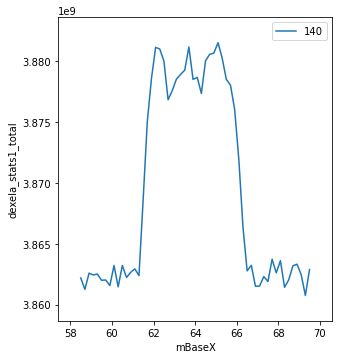

In [67]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, 58.5, 69.5, 11 * 5 + 1,
    time_per_point=0.2, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A line scan in x direction to determine the range at the powder parts."),
    take_dark=False
)
RE(plan)

In [68]:
RE(bps.mv(mBaseY, 42.0, mBaseX, 58.5, mPhi, 90.0))

()



Transient Scan ID: 141     Time: 2021-07-28 12:30:05
Persistent Unique Scan ID: '9b4eade3-4867-4142-bb39-6bae6489f151'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |     mBaseX | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 12:30:05.7 |    58.5000 |          3861119203 |
|         2 | 12:30:06.8 |    58.7000 |          3861746320 |
|         3 | 12:30:08.0 |    58.9000 |          3862978733 |
|         4 | 12:30:09.2 |    59.1000 |          3861510624 |
|         5 | 12:30:10.4 |    59.3000 |          3862373499 |
|         6 | 12:30:11.6 |    59.5000 |          3861587869 |
|         7 | 12:30:12.8 |    59.7000 |          3861799889 |
|         8 | 12:30:14.0 |    59.9000 |          3861264811 |
|         9 | 12:30:15.2 |    60.1000 |          3862621148 |
|        10 | 12:30:16.4 |    60.3000 |          3869066261 |
|        11 | 12:30:17.6 |    60.5000 |          38

('9b4eade3-4867-4142-bb39-6bae6489f151',)

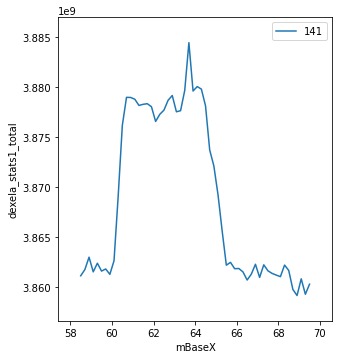

In [69]:
plan = grid_scan_nd(
    [dexela_c, mBaseX],
    mBaseX, 58.5, 69.5, 11 * 5 + 1,
    time_per_point=0.2, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A line scan in x direction to determine the range at the powder parts at 90 deg."),
    take_dark=False
)
RE(plan)

## Crystal

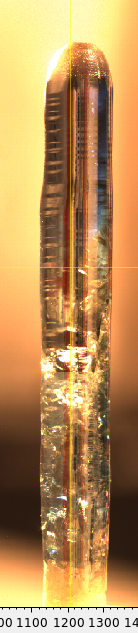

## Rocking curve with slit beam

In [75]:
RE(bps.mv(mBaseY, 10.0, mBaseX, 64.0, mPhi, 90.0))

()



Transient Scan ID: 142     Time: 2021-07-28 13:20:46
Persistent Unique Scan ID: '4c3a71a5-3046-418e-8ea1-3e009f2d9877'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 13:20:47.7 |    89.0000 |          3865945917 |
|         2 | 13:20:48.8 |    89.0025 |          3865992965 |
|         3 | 13:20:49.9 |    89.0050 |          3864800290 |
|         4 | 13:20:51.0 |    89.0075 |          3864698548 |
|         5 | 13:20:52.1 |    89.0100 |          3865129640 |
|         6 | 13:20:53.1 |    89.0125 |          3863874186 |
|         7 | 13:20:54.0 |    89.0150 |          3864272520 |
|         8 | 13:20:54.8 |    89.0175 |          3863888462 |
|         9 | 13:20:55.9 |    89.0200 |          3864096223 |
|        10 | 13:20:56.9 |    89.0225 |          3863656557 |
|        11 | 13:20:57.8 |    89.0250 |          38

('4c3a71a5-3046-418e-8ea1-3e009f2d9877',)

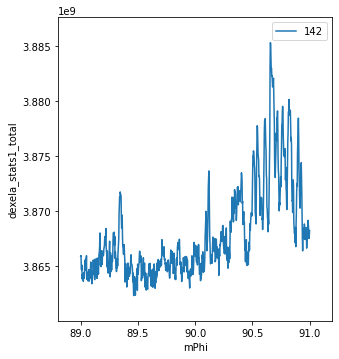

In [76]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 89, 91, 801,
    time_per_point=0.2, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A fine resolution rocking curve at the center around another angle 90 deg."),
    take_dark=False
)
RE(plan)

## Rocking curve using focus beam

In [77]:
def slitted_beam():
    mSlitsTop.move(0.125)
    mSlitsBottom.move(0.125)
    mSlitsOutboard.move(0.125)
    mSlitsInboard.move(0.125)
    mSigrayY.move(38.10016)
    return
    
    
def focused_beam():
    mSlitsTop.move(0.5)
    mSlitsBottom.move(0.5)
    mSlitsOutboard.move(0.5)
    mSlitsInboard.move(0.5)
    mSigrayY.move(38.10016+12.5)
    return

In [78]:
focused_beam()

In [79]:
def change_filters(s1, s2, s3, s4):
    yield from bpp.pchain(
        bps.mv(Filters.flt1, s1),
        bps.mv(Filters.flt2, s2),
        bps.mv(Filters.flt3, s3),
        bps.mv(Filters.flt4, s4),
    )

In [80]:
RE(change_filters("In", "In", "In", "In"))

()

In [81]:
RE(bps.mv(mBaseY, 10.0, mBaseX, 64.0, mPhi, 90.0))

()



Transient Scan ID: 143     Time: 2021-07-28 13:36:44
Persistent Unique Scan ID: '1098ceb5-1cf5-4dc0-8e1e-7f0b2ba7ab08'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 13:36:45.9 |    89.0000 |          3857670447 |
|         2 | 13:36:47.0 |    89.0025 |          3857468194 |
|         3 | 13:36:48.0 |    89.0050 |          3856889297 |
|         4 | 13:36:49.1 |    89.0075 |          3857514177 |
|         5 | 13:36:49.9 |    89.0100 |          3858007679 |
|         6 | 13:36:51.0 |    89.0125 |          3857386557 |
|         7 | 13:36:51.8 |    89.0150 |          3857324696 |
|         8 | 13:36:52.7 |    89.0175 |          3857807122 |
|         9 | 13:36:53.8 |    89.0200 |          3856684499 |
|        10 | 13:36:54.8 |    89.0225 |          3857208819 |
|        11 | 13:36:55.7 |    89.0250 |          38

('1098ceb5-1cf5-4dc0-8e1e-7f0b2ba7ab08',)

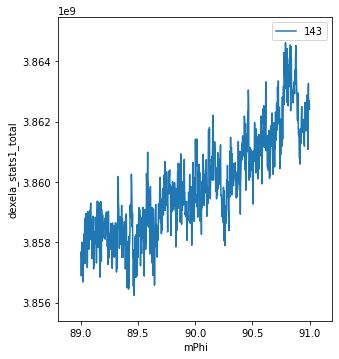

In [82]:
plan = grid_scan_nd(
    [dexela_c, mPhi],
    mPhi, 89, 91, 801,
    time_per_point=0.2, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A fine resolution rocking curve at the center around another angle 90 deg, focus beam."),
    take_dark=False
)
RE(plan)

### Grid scan at 90 deg

In [83]:
slitted_beam()

In [84]:
RE(change_filters("In", "In", "Out", "In"))

()

In [88]:
RE(bps.mv(mBaseY, 9.0, mBaseX, 59.0, mPhi, 89.0))

()

In [92]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 9.0, 42.0, 33 * 4 + 1,
    mBaseX, 59.0, 67.0, 8 * 4 + 1,
    mPhi, 89, 91, 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A grid scan with precession on the whole rod of rod at 90 deg"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 145     Time: 2021-07-28 15:01:25
Persistent Unique Scan ID: '3e7f4231-d379-459c-bf33-1e11aedabe73'
New stream: 'primary'





('3e7f4231-d379-459c-bf33-1e11aedabe73',)

### Grid scan at 0 deg

In [93]:
RE(bps.mv(mBaseY, 9.0, mBaseX, 59.0, mPhi, 89.0))

()

In [94]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 9.0, 42.0, 33 * 4 + 1,
    mBaseX, 59.0, 67.0, 8 * 4 + 1,
    mPhi, -1, 1, 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A grid scan with precession on the whole rod of rod at 0 deg"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 146     Time: 2021-07-28 18:07:49
Persistent Unique Scan ID: '3fa5bb56-9948-4014-9ba9-62258d5cf024'
New stream: 'primary'





('3fa5bb56-9948-4014-9ba9-62258d5cf024',)

### Grid scan (focus beam, fine resolution) at 90 deg

In [95]:
focused_beam()

In [96]:
RE(bps.mv(mBaseY, 38.0, mBaseX, 60.0, mPhi, 89.0))

()

In [97]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 38.0, 42.5, int(4.5 * 10) + 1,
    mBaseX, 60.0, 65.5, int(5.5 * 10) + 1,
    mPhi, 89, 91, 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A grid scan with precession on the transition  rod at 0 deg"),
    take_dark=False
)
RE(plan)



Transient Scan ID: 147     Time: 2021-07-28 21:03:56
Persistent Unique Scan ID: '1854f609-2ea8-4bc5-9b5e-31705400a609'
New stream: 'primary'





('1854f609-2ea8-4bc5-9b5e-31705400a609',)

### Grid scan (focus beam, fine resolution) at 0 deg

In [98]:
RE(bps.mv(mBaseY, 38.0, mBaseX, 61.0, mPhi, -1.0))

()

In [ ]:
plan = fly_scan_nd_no_shutter(
    [dexela_c],
    mBaseY, 38.0, 42.5, int(4.5 * 10) + 1,
    mBaseX, 61.0, 66.5, int(5.5 * 10) + 1,
    mPhi, -1, 1, 1,
    move_velocity=4.,
    time_per_point=0.5, time_per_frame=0.1,
    shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
    shutter_wait_close=0., shutter_wait_open=0.,
    md=dict(**SAMPLE2, task="A fine resolution grid scan with precession on the transition area of the rod at 0 deg. The fomer scan '1854f609-2ea8-4bc5-9b5e-31705400a609' is the same type of scan at 90 deg but I wrote down a wrong task."),
    take_dark=False
)
RE(plan)



Transient Scan ID: 148     Time: 2021-07-28 22:32:56
Persistent Unique Scan ID: 'aca27038-de6b-4122-a5c6-d4951fb0ed98'
New stream: 'primary'


### Coarse grid rocking curves

In [100]:
slitted_beam()



Transient Scan ID: 149     Time: 2021-07-29 00:10:58
Persistent Unique Scan ID: 'f29413af-1765-4ebd-a2e6-8c81d92eba71'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 00:10:59.1 |    -1.0000 |          3878196885 |
|         2 | 00:11:00.1 |    -0.9950 |          3876796327 |
|         3 | 00:11:01.1 |    -0.9900 |          3876760235 |
|         4 | 00:11:02.1 |    -0.9850 |          3878667913 |
|         5 | 00:11:02.9 |    -0.9800 |          3879048477 |
|         6 | 00:11:03.7 |    -0.9750 |          3881533750 |
|         7 | 00:11:04.8 |    -0.9700 |          3884421653 |
|         8 | 00:11:05.6 |    -0.9650 |          3889983024 |
|         9 | 00:11:06.4 |    -0.9600 |          3889153120 |
|        10 | 00:11:07.2 |    -0.9550 |          3883078472 |
|        11 | 00:11:08.0 |    -0.9500 |          38

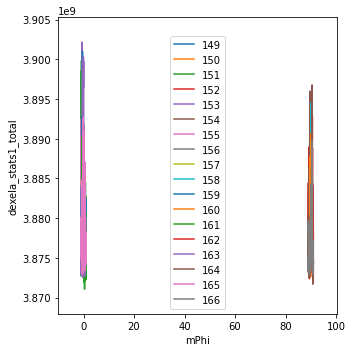

In [104]:
ys = [22.0, 17.0, 12.0]
xs = [61.5, 63.0, 64.5]
phis = [0.0, 90.0]
for y in ys:
    for x in xs:
        for phi in phis:
            RE(bps.mv(mBaseY, y, mBaseX, x,  mPhi, phi - 1.))
            plan = grid_scan_nd(
                [dexela_c, mPhi],
                mPhi, phi - 1., phi + 1., 401,
                time_per_point=0.2, time_per_frame=0.1,
                shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
                shutter_wait_close=0., shutter_wait_open=0.,
                md=dict(
                    **SAMPLE2,
                    task="A grid rocking curve at 'pos_x', 'pos_y', 'pos_phi'.",
                    pos_x=x, pos_y=y, pos_phi=phi
                ),
                take_dark=False
            )
            RE(plan)

### Small grid scans

In [105]:
phis = [15., 30., 45., 60., 75., 90., 105., 120., 135., 150., 165.]
for phi in phis:
    RE(bps.mv(mBaseX, 60.0, mBaseY, 35.0, mPhi, phi - 1.))
    plan = fly_scan_nd_no_shutter(
        [dexela_c],
        mBaseY, 35.0, 42.5, 31,
        mBaseX, 60.0, 66.5, 27,
        mPhi, phi-1., phi+1., 1,
        move_velocity=4.,
        time_per_point=0.5, time_per_frame=0.1,
        shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
        shutter_wait_close=0., shutter_wait_open=0.,
        md=dict(
            **SAMPLE2, 
            task="A grid scan at 'pos_phi' angle.", pos_phi=phi
        ),
        take_dark=False
    )
    RE(plan)



Transient Scan ID: 167     Time: 2021-07-29 02:23:19
Persistent Unique Scan ID: '3819c4d8-b3d0-489f-977d-0b4ebc73e3d2'
New stream: 'primary'





Transient Scan ID: 168     Time: 2021-07-29 02:58:47
Persistent Unique Scan ID: '3ad6b281-07fe-4d10-95fd-533e9a60a73b'
New stream: 'primary'





Transient Scan ID: 169     Time: 2021-07-29 03:34:04
Persistent Unique Scan ID: '66fc4d4e-f425-4dcf-a2ac-7105ad7769e4'
New stream: 'primary'





Transient Scan ID: 170     Time: 2021-07-29 04:09:14
Persistent Unique Scan ID: 'f8fc8608-35fe-4500-9bd5-a559dd9dd87b'
New stream: 'primary'





Transient Scan ID: 171     Time: 2021-07-29 04:44:35
Persistent Unique Scan ID: '538ad090-c331-4667-94c7-b7588a6fe541'
New stream: 'primary'





Transient Scan ID: 172     Time: 2021-07-29 05:20:08
Persistent Unique Scan ID: '6d3cd102-8d5d-452c-938c-f57ea7b90c1d'
New stream: 'primary'





Transient Scan ID: 173     Time: 2021-07-29 05:55:34
Persistent Unique Scan ID: '88d84e89-d571-45a6-8483-881553a5b6e3'
New

### Coarse grid rocking curves again



Transient Scan ID: 178     Time: 2021-07-29 09:02:43
Persistent Unique Scan ID: 'eec459e5-dae5-4c14-abc9-f873fcfb6d1e'
New stream: 'primary'
+-----------+------------+------------+---------------------+
|   seq_num |       time |       mPhi | dexela_stats1_total |
+-----------+------------+------------+---------------------+
|         1 | 09:02:44.4 |    44.0000 |          3877510192 |
|         2 | 09:02:45.4 |    44.0050 |          3876290214 |
|         3 | 09:02:46.3 |    44.0100 |          3875253245 |
|         4 | 09:02:47.4 |    44.0150 |          3877033084 |
|         5 | 09:02:48.3 |    44.0200 |          3876914647 |
|         6 | 09:02:49.4 |    44.0250 |          3876474258 |
|         7 | 09:02:50.3 |    44.0300 |          3877103610 |
|         8 | 09:02:51.2 |    44.0350 |          3876238897 |
|         9 | 09:02:52.2 |    44.0400 |          3876979112 |
|        10 | 09:02:53.3 |    44.0450 |          3876914406 |
|        11 | 09:02:54.4 |    44.0500 |          38

RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.


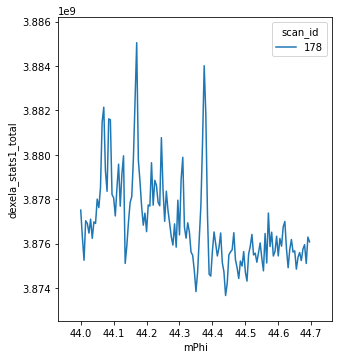

In [106]:
ys = [12.0, 17.0, 22.0]
xs = [61.5, 63.0, 64.5]
phis = [45.0, 135.0]
for y in ys:
    for x in xs:
        for phi in phis:
            RE(bps.mv(mBaseY, y, mBaseX, x,  mPhi, phi - 1.))
            plan = grid_scan_nd(
                [dexela_c, mPhi],
                mPhi, phi - 1., phi + 1., 401,
                time_per_point=0.2, time_per_frame=0.1,
                shutter=FastShutter, shutter_close=SHUTTER_CLOSE, shutter_open=SHUTTER_OPEN,
                shutter_wait_close=0., shutter_wait_open=0.,
                md=dict(
                    **SAMPLE2,
                    task="A grid rocking curve at 'pos_x', 'pos_y', 'pos_phi'.",
                    pos_x=x, pos_y=y, pos_phi=phi
                ),
                take_dark=False
            )
            RE(plan)

In [107]:
RE.abort()

Aborting: running cleanup and marking exit_status as 'abort'...
+-----------+------------+------------+---------------------+
generator grid_scan ['eec459e5'] (scan num: 178)





Run aborted
Traceback (most recent call last):
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/run_engine.py", line 1365, in _run
    msg = self._plan_stack[-1].send(resp)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 1307, in __call__
    return (yield from plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 1160, in baseline_wrapper
    return (yield from plan)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 803, in monitor_during_wrapper
    return (yield from plan2)
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 170, in plan_mutator
    raise ex
  File "/opt/conda_envs/collection-2021-1.2/lib/python3.7/site-packages/bluesky/preprocessors.py", line 123, in plan_mutator
    msg = plan_stack[-1].send(ret)
  File "/opt/conda_envs

('eec459e5-dae5-4c14-abc9-f873fcfb6d1e',)